# NGC  group


# Issues

* profiles in mstar and sfr stop when photutils hits a nan
* but this is not good for big spirals like VFID5889-NGC5364 - there are nans inbetween spiral arms
* could save linear rather than log.

In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

from PIL import Image

import glob

homedir = os.getenv("HOME")

import warnings
warnings.filterwarnings('ignore')


%matplotlib inline
mycolors = plt.rcParams['axes.prop_cycle'].by_key()['color']
plotdir = homedir+'/research/Virgo/plots/halpha/'

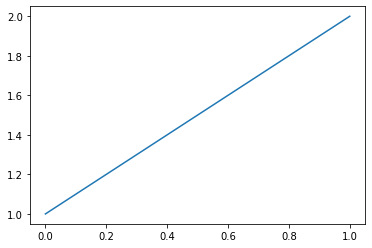

In [2]:
%matplotlib inline
plt.figure()
plt.plot([1,2])

# Galaxies for NGC Group

* need to fix code to handle offcenter galaxies

* add SNR cut to the sSFR image
  * create object mask
  * calc std in remaining pixels
  * cut sSFR and SNR > 3
* [link to slides](https://docs.google.com/presentation/d/1DXOzvhq8jZzwO3-u1x7ts6d-fUNfM42bwe1AlhGKusA/edit?usp=sharing) on NGC 5364 Group

* syncing files from draco to adjust continuum subtraction.

```
rsync -avz --exclude="mastDownload" /data-pool/Halpha/halphagui-output-20240104/cutouts/VFID5851* .
```
### Members

|VFID|	NED Name| INT | HDI | Comments
|------|------|----|---|----|
|VFID5889|	NGC 5364|x | x|Primary spiral |
|VFID5892|	NGC 5360|x | x| truncated|
|VFID5842|	NGC 5356|x |x |Truncated|
|VFID5851|	NGC 5363| x| x| Elliptical, saturated in legacy,so g-r correction does not work |
| | | | |Looks like there is structure - should try with CS.fits|
|VFID5855|	NGC 5348|X | NA |extraplanar |
|VFID5844|	SDSSJ| x| x|smudge |
|VFID5859|	WISEJ|X |X |HI tail; halpha concentrated on opposite edge |
|VFID5868|	SDSSJ| x| x| can't see it in continuum|
|VFID5879|	SDSSJ|x |x |really no halpha |

In [143]:
vfid_group_membs = [5842,5844,5851,5855,5859,5868,5879,5889,5892]

In [258]:
%run ~/github/Virgo/programs/readtablesv2.py
groupFlag = np.zeros(len(v.main),'bool')
for vf in vfid_group_membs:
    groupFlag[vf]=True

<Figure size 432x288 with 0 Axes>

# Make a table for paper

# VFID5889-NGC5364

observed twice

VFID5889: halpha filter correction = 1.057
Subtracting -7.46e-05 from r-band image
Subtracting -4.62e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5889-legacy-1113-gr-ha-smooth.fits
telescope =  HDI VFID5889-NGC5364-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.19e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 4.29e-04 e-18
STD cut in SF image = 3.590e-06
getting object position from RA and DEC
(724.933051653962, 1229.3910383661134) 724.933051653962 724.933051653962 1229.3910383661134 1229.3910383661134
getting object position from RA and DEC
(724.933051653962, 1229.3910383661134) 724.933051653962 724.933051653962 1229.3910383661134 1229.3910383661134
getting object position from RA and DEC
(724.933051653962, 1229.3910383661134) 724.933051653962 724.933051653962 1229.3910383661134 1229.39103836611

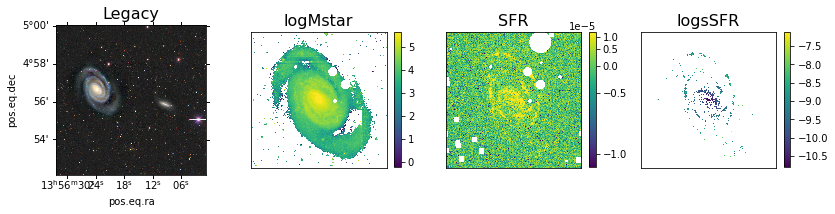

<Figure size 432x288 with 0 Axes>

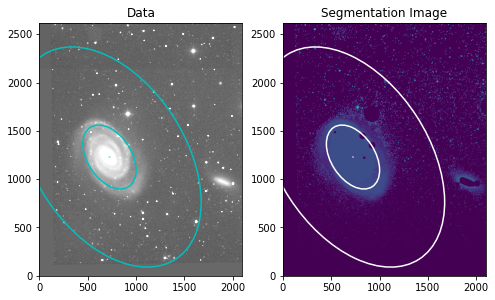

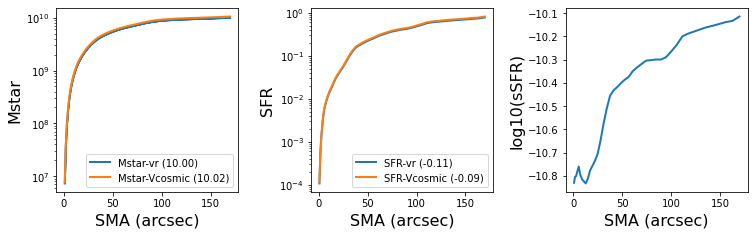

In [14]:
# this is all the commands to get new CS image and mstar/sfr/ssfr profiles
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5889-NGC5364-HDI-20180313-p056'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5889: halpha filter correction = 1.057
Subtracting -9.00e-05 from r-band image
Subtracting -5.67e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5889-legacy-1093-gr-ha-smooth.fits
telescope =  INT VFID5889-NGC5364-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 6.78e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 1.33e-03 e-18
STD cut in SF image = 7.709e-07
getting object position from RA and DEC
(701.3776178572216, 1527.2088974360606) 701.3776178572216 701.3776178572216 1527.2088974360606 1527.2088974360606
getting object position from RA and DEC
(701.3776178572216, 1527.2088974360606) 701.3776178572216 701.3776178572216 1527.2088974360606 1527.2088974360606
getting object position from RA and DEC
(701.3776178572216, 1527.2088974360606) 701.3776178572216 701.3776178572216 1527.2088974360606 1527.20

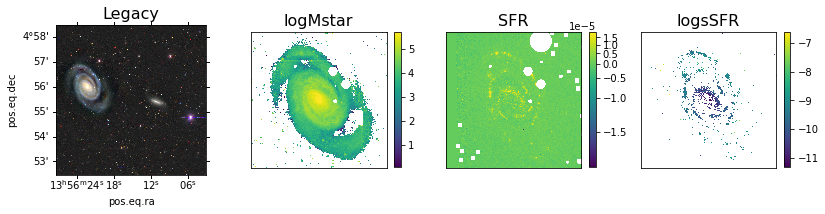

<Figure size 432x288 with 0 Axes>

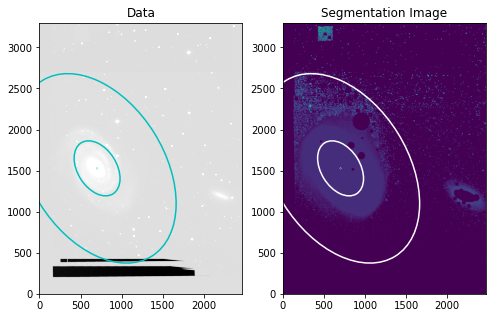

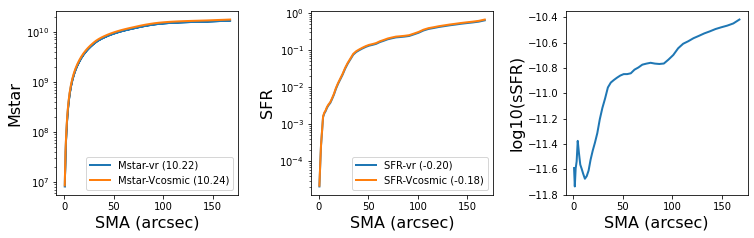

In [15]:
##### this is all the commands to get new CS image and mstar/sfr/ssfr profiles
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5889-NGC5364-INT-20190206-p120'
scalefactor = 1
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5851 - NGC 5363

Elliptical

VFID5851: halpha filter correction = 1.042
Subtracting -6.27e-05 from r-band image
Subtracting -3.89e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5851-legacy-950-gr-ha-smooth.fits
telescope =  HDI VFID5851-NGC5363-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.17e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.92e-04 e-18
STD cut in SF image = 2.793e-06


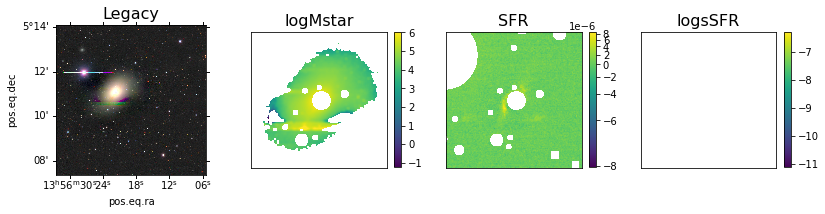

In [87]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5851-NGC5363-HDI-20180313-p056'
scalefactor = 1.0
#%run ~/github/havirgo/python/reproject_images_2ha.py $dirname
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
#%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
#%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5851: halpha filter correction = 1.042
Subtracting -7.84e-05 from r-band image
Subtracting -4.40e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5851-legacy-950-gr-ha-smooth.fits
telescope =  INT VFID5851-NGC5363-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 6.50e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 1.14e-03 e-18
STD cut in SF image = 5.949e-07


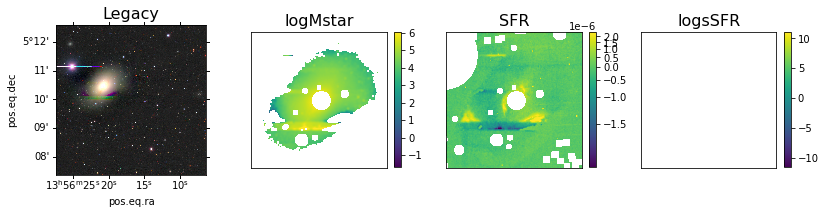

In [89]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5851-NGC5363-INT-20190206-p120'
scalefactor = .95
#%run ~/github/havirgo/python/reproject_images_2ha.py $dirname
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
#%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
#%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5855-NGC5348

VFID5855: halpha filter correction = 1.078
Subtracting -9.23e-05 from r-band image
Subtracting -5.27e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5855-legacy-682-gr-ha-smooth.fits
telescope =  INT VFID5855-NGC5348-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 0.0 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 0.0 e-18
STD cut in SF image = 8.939e-07
getting object position from RA and DEC
(1025.6557806117194, 1016.0584328414839) 1025.6557806117194 1025.6557806117194 1016.0584328414839 1016.0584328414839
getting object position from RA and DEC
(1025.6557806117194, 1016.0584328414839) 1025.6557806117194 1025.6557806117194 1016.0584328414839 1016.0584328414839
getting object position from RA and DEC
(1025.6557806117194, 1016.0584328414839) 1025.6557806117194 1025.6557806117194 1016.0584328414839 1016.0584

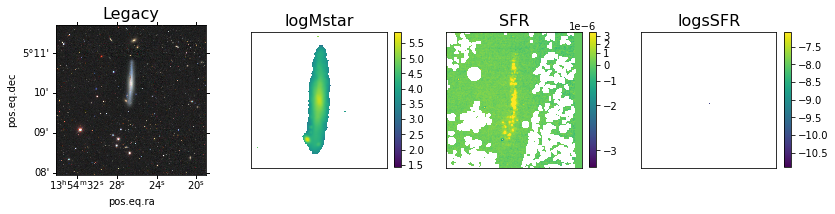

<Figure size 432x288 with 0 Axes>

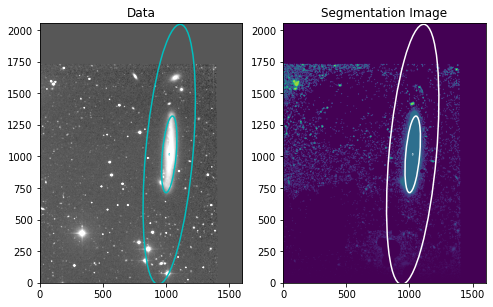

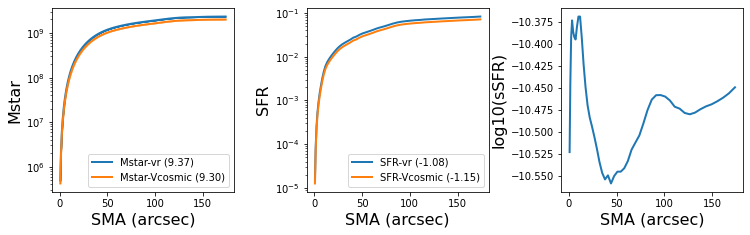

In [19]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5855-NGC5348-INT-20190206-p120'
scalefactor = 1.0
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5842-NGC5356

VFID5842: halpha filter correction = 1.072
Subtracting -1.07e-04 from r-band image
Subtracting -5.37e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5842-legacy-560-gr-ha-smooth.fits
telescope =  HDI VFID5842-NGC5356-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.20e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.93e-04 e-18
STD cut in SF image = 4.457e-06
getting object position from RA and DEC
(846.3454730036599, 849.3451285087399) 846.3454730036599 846.3454730036599 849.3451285087399 849.3451285087399
getting object position from RA and DEC
(846.3454730036599, 849.3451285087399) 846.3454730036599 846.3454730036599 849.3451285087399 849.3451285087399
getting object position from RA and DEC
(846.3454730036599, 849.3451285087399) 846.3454730036599 846.3454730036599 849.3451285087399 849.345128508739

<Figure size 432x288 with 0 Axes>

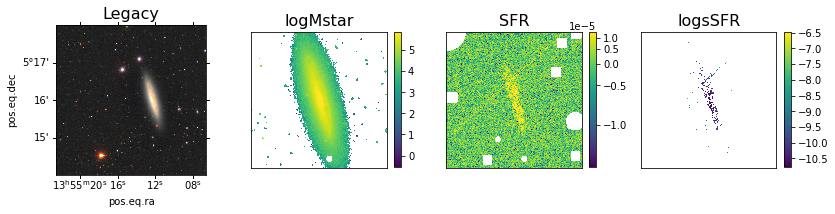

<Figure size 432x288 with 0 Axes>

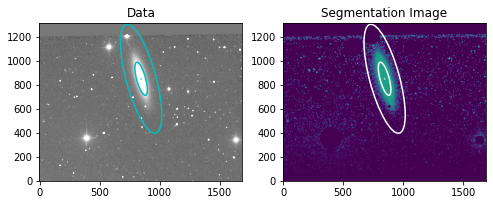

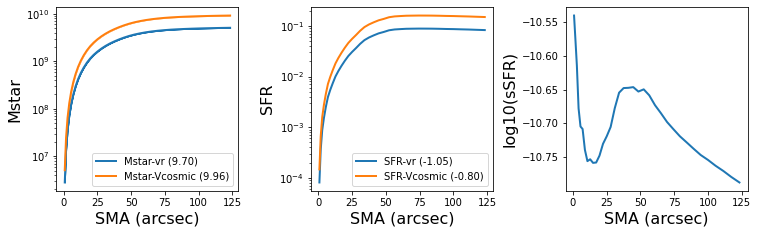

In [390]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5842-NGC5356-HDI-20180313-p056'
scalefactor = 1.08
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5842: halpha filter correction = 1.072
Subtracting -7.21e-05 from r-band image
Subtracting -4.07e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5842-legacy-719-gr-ha-smooth.fits
telescope =  INT VFID5842-NGC5356-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 5.61e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 9.78e-04 e-18
STD cut in SF image = 8.552e-07
Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
getting object position from RA and DEC
(1087.5801050722548, 1091.2460703040215) 1087.5801050722548 1087.5801050722548 1091.2460703040215 1091.2460703040215
getting object position from RA and DEC
(1087.5801050722548, 1091.2460703040215) 108

<Figure size 640x480 with 0 Axes>

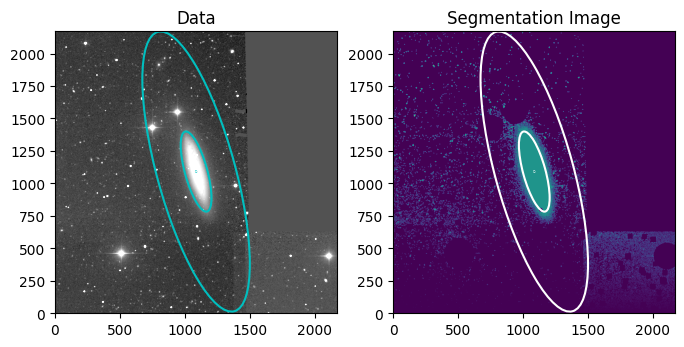

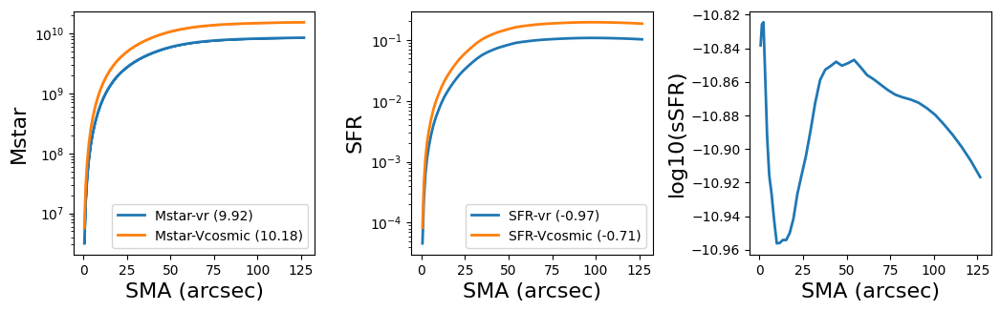

In [230]:
# trying with the halpha_filter_cor
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5842-NGC5356-INT-20190206-p120'
scalefactor = 0.97
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

In [ ]:
plt.imshow(maskdat)

# VFID5892


VFID5892: halpha filter correction = 1.048
Subtracting -1.61e-04 from r-band image
Subtracting -1.09e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5892-legacy-320-gr-ha-smooth.fits
telescope =  HDI VFID5892-NGC5360-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.33e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.91e-04 e-18
STD cut in SF image = 3.140e-06
getting object position from RA and DEC
(390.8626370385299, 371.1420014185765) 390.8626370385299 390.8626370385299 371.1420014185765 371.1420014185765
getting object position from RA and DEC
(390.8626370385299, 371.1420014185765) 390.8626370385299 390.8626370385299 371.1420014185765 371.1420014185765
getting object position from RA and DEC
(390.8626370385299, 371.1420014185765) 390.8626370385299 390.8626370385299 371.1420014185765 371.142001418576

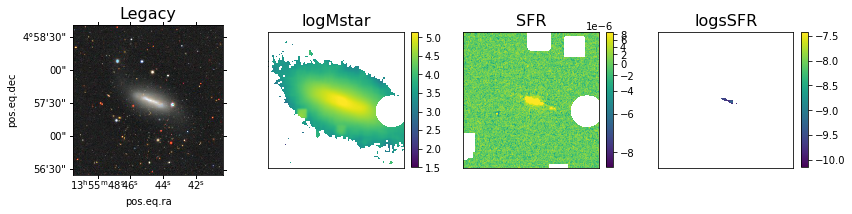

<Figure size 432x288 with 0 Axes>

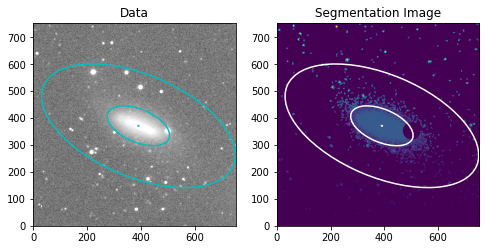

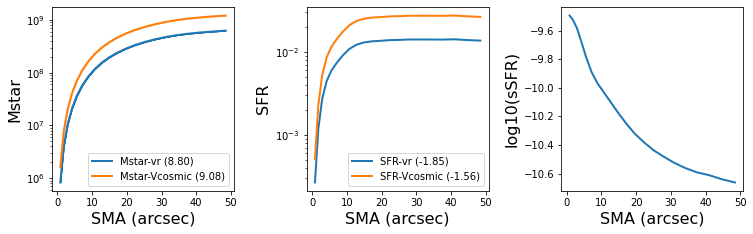

In [65]:
# trying with the halpha_filter_cor
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5892-NGC5360-HDI-20180313-p056'
scalefactor = 1.0
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5892: halpha filter correction = 1.048
Subtracting -1.84e-04 from r-band image
Subtracting -1.20e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5892-legacy-320-gr-ha-smooth.fits
telescope =  INT VFID5892-NGC5360-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 6.66e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 7.45e-04 e-18
STD cut in SF image = 7.144e-07


<Figure size 432x288 with 0 Axes>

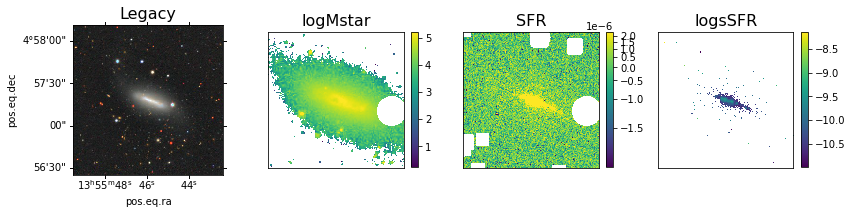

In [235]:
# trying with the halpha_filter_cor
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5892-NGC5360-INT-20190206-p120'
scalefactor = .91
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
#%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
#%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5859 WISEAJ135504.45+051121.7

observed twice

VFID5859: halpha filter correction = 1.075
Subtracting 6.01e-04 from r-band image
Subtracting 3.52e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5859-legacy-63-gr-ha-smooth.fits
telescope =  HDI VFID5859-WISEAJ135504.45+051121.7-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.34e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.81e-04 e-18
STD cut in SF image = 4.593e-06
getting object position from RA and DEC
(77.3540954237144, 68.2121549516919) 77.3540954237144 77.3540954237144 68.2121549516919 68.2121549516919
getting object position from RA and DEC
(77.3540954237144, 68.2121549516919) 77.3540954237144 77.3540954237144 68.2121549516919 68.2121549516919
getting object position from RA and DEC
(77.3540954237144, 68.2121549516919) 77.3540954237144 77.3540954237144 68.2121549516919 68.2121549516919
ge

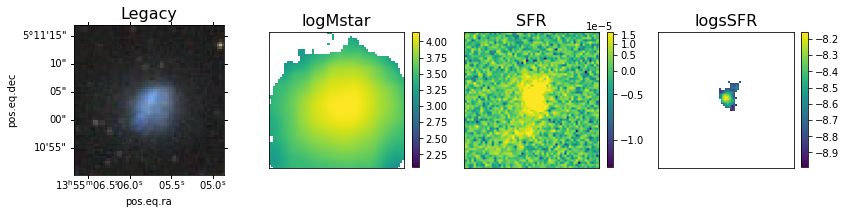

<Figure size 432x288 with 0 Axes>

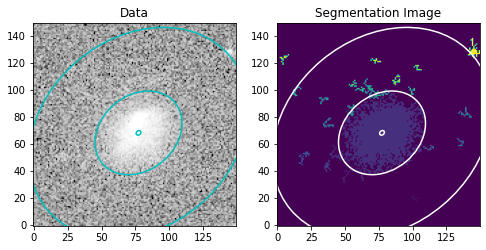

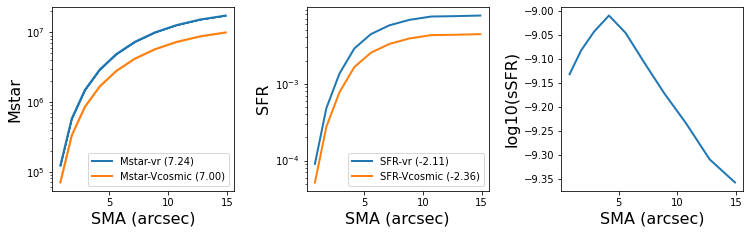

In [70]:


# trying with the halpha_filter_cor
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5859-WISEAJ135504.45+051121.7-HDI-20180313-p056'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5859: halpha filter correction = 1.075
Subtracting 6.47e-04 from r-band image
Subtracting 3.92e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5859-legacy-63-gr-ha-smooth.fits
telescope =  INT VFID5859-WISEAJ135504.45+051121.7-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 5.98e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 5.47e-04 e-18
STD cut in SF image = 8.589e-07
getting object position from RA and DEC
(97.86696362104028, 88.60689375685675) 97.86696362104028 97.86696362104028 88.60689375685675 88.60689375685675
getting object position from RA and DEC
(97.86696362104028, 88.60689375685675) 97.86696362104028 97.86696362104028 88.60689375685675 88.60689375685675
getting object position from RA and DEC
(97.86696362104028, 88.60689375685675) 97.86696362104028 97.86696362104028 88.60689375685675 88

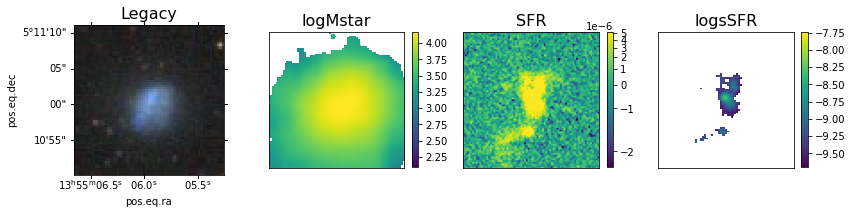

<Figure size 432x288 with 0 Axes>

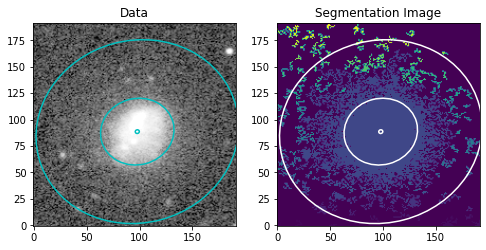

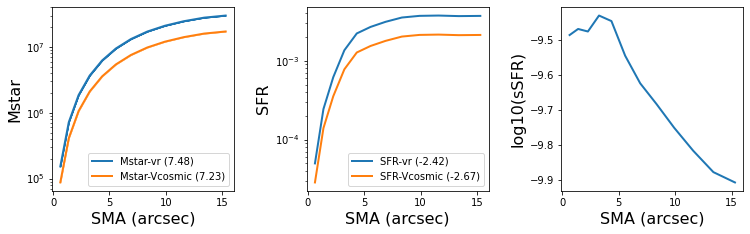

In [73]:
# trying with the halpha_filter_cor
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5859-WISEAJ135504.45+051121.7-INT-20190206-p120'
scalefactor = 1.1
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5879 SDSSJ135502.70+050525.1

VFID5879: halpha filter correction = 0.000
resetting filter correction to 1
Subtracting 1.30e-03 from r-band image
Subtracting 6.53e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5879-legacy-68-gr-ha-smooth.fits
telescope =  HDI VFID5879-SDSSJ135502.70+050525.1-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.28e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.49e-04 e-18
STD cut in SF image = 4.167e-06
getting object position from RA and DEC
(79.39764001430933, 80.71438400216874) 79.39764001430933 79.39764001430933 80.71438400216874 80.71438400216874
getting object position from RA and DEC
(79.39764001430933, 80.71438400216874) 79.39764001430933 79.39764001430933 80.71438400216874 80.71438400216874
getting object position from RA and DEC
(79.39764001430933, 80.71438400216874) 79.39764001430933 79.397

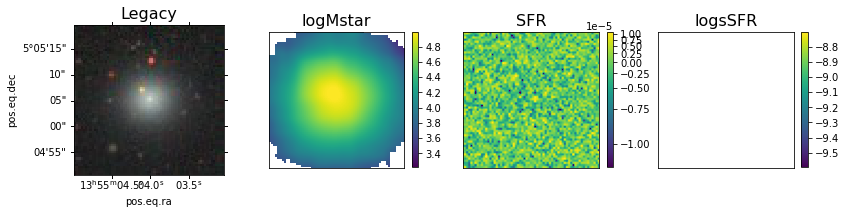

<Figure size 432x288 with 0 Axes>

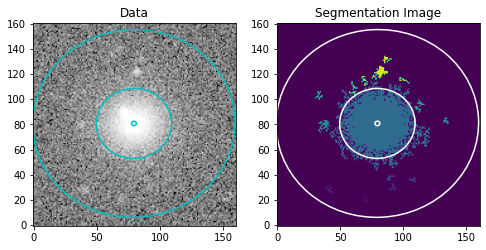

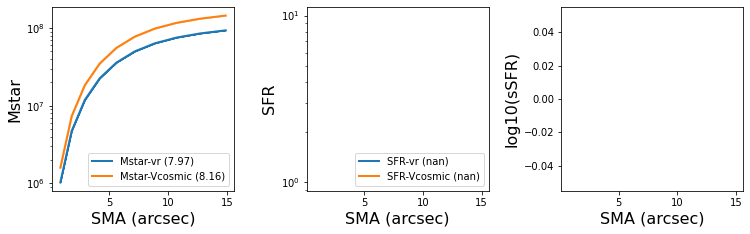

In [82]:


%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5879-SDSSJ135502.70+050525.1-HDI-20180313-p056'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5879: halpha filter correction = 0.000
resetting filter correction to 1
Subtracting 1.19e-03 from r-band image
Subtracting 6.14e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5879-legacy-68-gr-ha-smooth.fits
telescope =  INT VFID5879-SDSSJ135502.70+050525.1-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 7.59e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 6.81e-04 e-18
STD cut in SF image = 1.076e-06
getting object position from RA and DEC
(102.56174397611917, 101.8919578261791) 102.56174397611917 102.56174397611917 101.8919578261791 101.8919578261791
getting object position from RA and DEC
(102.56174397611917, 101.8919578261791) 102.56174397611917 102.56174397611917 101.8919578261791 101.8919578261791
getting object position from RA and DEC
(102.56174397611917, 101.8919578261791) 102.5617439761191

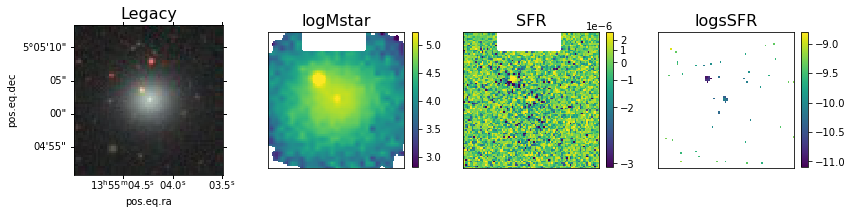

<Figure size 432x288 with 0 Axes>

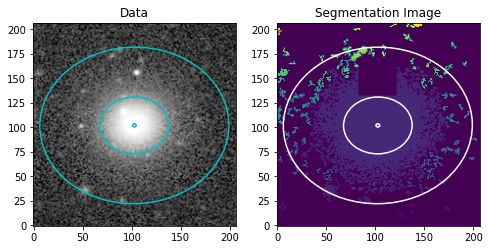

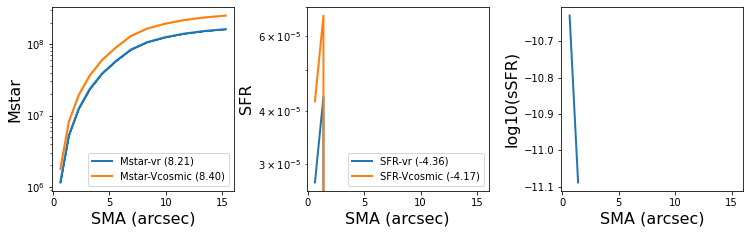

In [13]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5879-SDSSJ135502.70+050525.1-INT-20190206-p120'
scalefactor = .95
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5844 - SDSS

VFID5844: halpha filter correction = 0.000
resetting filter correction to 1
Subtracting 1.55e-03 from r-band image
Subtracting 8.42e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5844-legacy-64-gr-ha-smooth.fits
telescope =  HDI VFID5844-SDSSJ135621.31+051944.2-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.54e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 3.19e-04 e-18
STD cut in SF image = 4.820e-06
getting object position from RA and DEC
(80.36351855832886, 69.45526964521035) 80.36351855832886 80.36351855832886 69.45526964521035 69.45526964521035
getting object position from RA and DEC
(80.36351855832886, 69.45526964521035) 80.36351855832886 80.36351855832886 69.45526964521035 69.45526964521035
getting object position from RA and DEC
(80.36351855832886, 69.45526964521035) 80.36351855832886 80.363

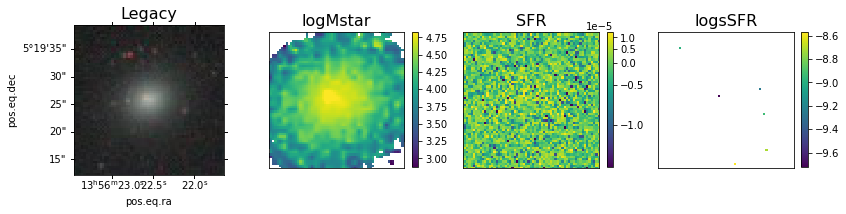

<Figure size 432x288 with 0 Axes>

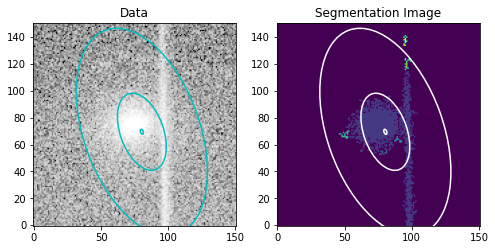

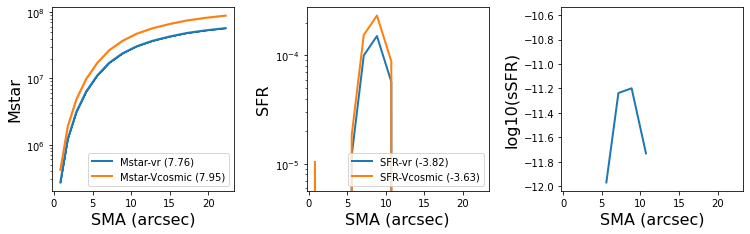

In [10]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5844-SDSSJ135621.31+051944.2-HDI-20180313-p056'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5844: halpha filter correction = 0.000
resetting filter correction to 1
Subtracting 1.56e-03 from r-band image
Subtracting 8.42e-04 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5844-legacy-64-gr-ha-smooth.fits
telescope =  INT VFID5844-SDSSJ135621.31+051944.2-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 9.16e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 8.45e-04 e-18
STD cut in SF image = 1.326e-06
getting object position from RA and DEC
(95.37060223819327, 96.97661771476588) 95.37060223819327 95.37060223819327 96.97661771476588 96.97661771476588
getting object position from RA and DEC
(95.37060223819327, 96.97661771476588) 95.37060223819327 95.37060223819327 96.97661771476588 96.97661771476588
getting object position from RA and DEC
(95.37060223819327, 96.97661771476588) 95.37060223819327 95.370

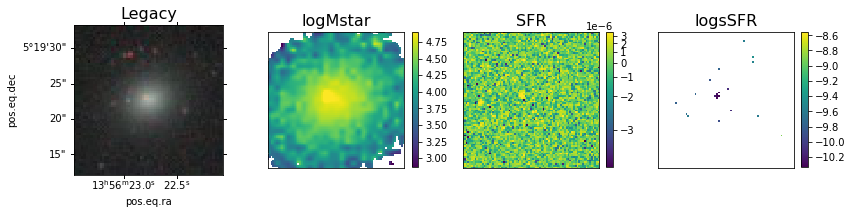

<Figure size 432x288 with 0 Axes>

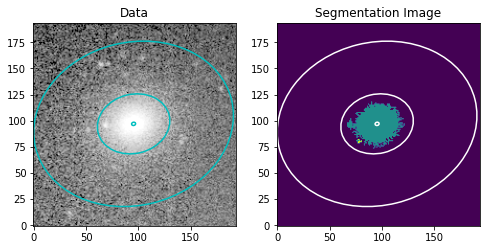

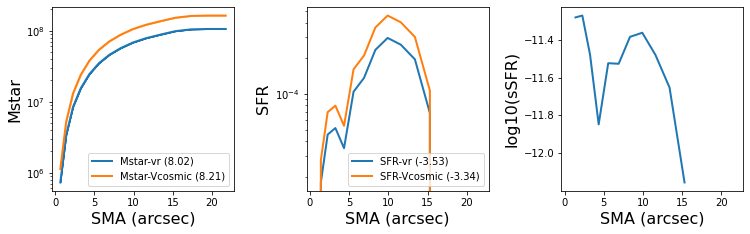

In [11]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5844-SDSSJ135621.31+051944.2-INT-20190206-p120'
scalefactor = 1
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

# VFID5868 - SDSS


VFID5868: halpha filter correction = 1.080
Subtracting -1.64e-04 from r-band image
Subtracting -8.80e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5868-legacy-59-gr-ha-smooth.fits
telescope =  HDI VFID5868-SDSSJ135615.94+050954.0-HDI-20180313-p056

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 3.27e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 2.50e-04 e-18
STD cut in SF image = 5.180e-06
getting object position from RA and DEC
(67.8961342583879, 70.16745417727006) 67.8961342583879 67.8961342583879 70.16745417727006 70.16745417727006
getting object position from RA and DEC
(67.8961342583879, 70.16745417727006) 67.8961342583879 67.8961342583879 70.16745417727006 70.16745417727006
getting object position from RA and DEC
(67.8961342583879, 70.16745417727006) 67.8961342583879 67.8961342583879 70.16745417727006 70.1674541

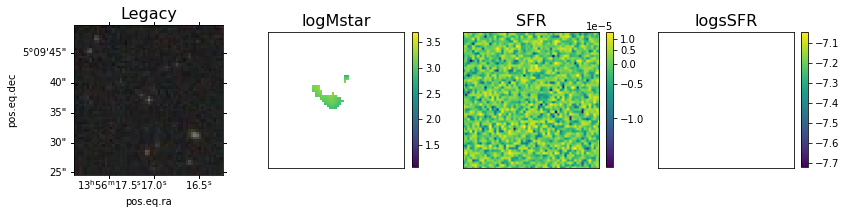

<Figure size 432x288 with 0 Axes>

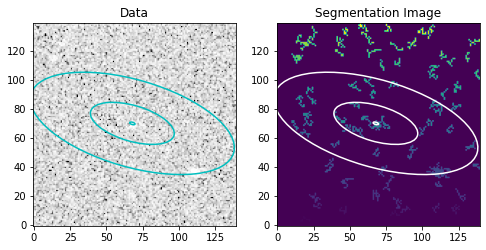

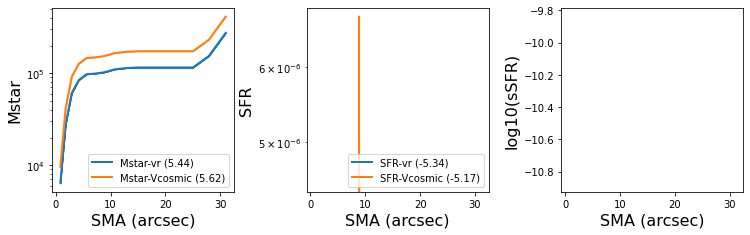

In [96]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5868-SDSSJ135615.94+050954.0-HDI-20180313-p056'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

VFID5868: halpha filter correction = 1.080
Subtracting -1.69e-04 from r-band image
Subtracting -9.05e-05 from g-band image
Smoothing images for color calculation
writing g-r color image to legacy/VFID5868-legacy-59-gr-ha-smooth.fits
telescope =  INT VFID5868-SDSSJ135615.94+050954.0-INT-20190206-p120

Generate NET image

Computing median values for r and halpha images
currently, I am not subtracting these, so check values...
Unbinned SB limit 1sigma 6.00e-03 e-18
Smoothing net image
Smoothed 15x15 SB limit 1sigma 5.54e-04 e-18
STD cut in SF image = 9.996e-07
getting object position from RA and DEC
(79.54048093061012, 106.93043898089552) 79.54048093061012 79.54048093061012 106.93043898089552 106.93043898089552
getting object position from RA and DEC
(79.54048093061012, 106.93043898089552) 79.54048093061012 79.54048093061012 106.93043898089552 106.93043898089552
getting object position from RA and DEC
(79.54048093061012, 106.93043898089552) 79.54048093061012 79.54048093061012 106.93043898

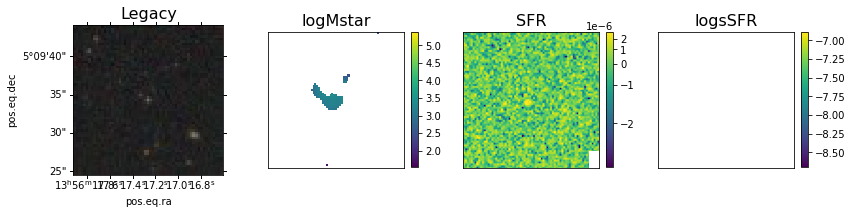

<Figure size 432x288 with 0 Axes>

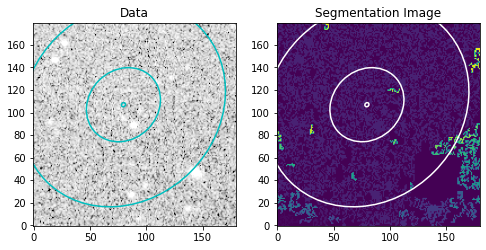

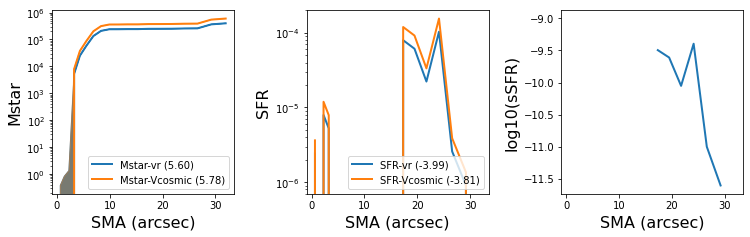

In [97]:
%matplotlib inline
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
# add scale factor for continuue after the directory name
dirname = 'VFID5868-SDSSJ135615.94+050954.0-INT-20190206-p120'
scalefactor = 1.
%run ~/github/havirgo/python/subtract_continuum.py $dirname $scalefactor
%run ~/github/havirgo/python/make_mstar_image.py $dirname 
#%run ~/github/havirgo/python/get_gr_cont_phot.py $dirname
%run ~/github/havirgo/python/get_mstar_sfr_phot.py $dirname
%run ~/github/havirgo/python/plot_mstar_sfr_phot.py $dirname
plt.show()

In [197]:
# trying to display stellar mass and sSFR images better
def display_image(image,percent=99.9,lowrange=False,mask=None,sigclip=True,cmap='gray_r'):
    #from astropy.visualization import SqrtStretch
    #from astropy.visualization.mpl_normalize import ImageNormalize

    from astropy.stats import sigma_clip
    from astropy.visualization import simple_norm

    lowrange=False
    if sigclip:
        clipped_data = sigma_clip(image,sigma_lower=5,sigma_upper=5)#,grow=10)
    else:
        clipped_data = image
    if lowrange:
        norm = simple_norm(clipped_data, stretch='linear',percent=percent)
    else:
        norm = simple_norm(clipped_data, stretch='asinh',percent=percent)

    plt.imshow(image, norm=norm,cmap=cmap,origin='lower')
    #v1,v2=scoreatpercentile(image,[.5,99.5])            
    #plt.imshow(image, cmap='gray_r',vmin=v1,vmax=v2,origin='lower')    

    
def plot_mstar_sfr(dirname,xmin=None,xmax=None,ymin=None,ymax=None,xticks=True,figsize=[16,6],cbfrac=.08,cbaspect=20,clevels=[4,5],contourFlag=False):
    %matplotlib inline
    os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
    # add scale factor for continuue after the directory name


    cwd = os.getcwd()
    os.chdir(dirname)
    massim = dirname+"-logmstar-vr.fits"
    sfrim = dirname+"-sfr-vr.fits"
    ssfrim = dirname+"-ssfr.fits"
    mask = dirname+'-R-mask.fits'
    titles = ['log Mstar','SFR','log sSFR']
    vmin = [2,0,-11.5]
    vmax = [6,1.e-6,-9]
    allim = [massim,sfrim,ssfrim]
    

    
    plt.figure(figsize=(figsize[0],figsize[1]))

    plt.subplots_adjust(wspace=0.1)
    maskdat = fits.getdata(mask)

    allax = []
    for i, im in enumerate(allim):
        plt.subplot(1,4,i+2)
        dat = fits.getdata(im)
        mdat = np.ma.array(dat,mask=maskdat)
        if xmin == None:
            mdat = mdat
        else:
            mdat = mdat[ymin:ymax,xmin:xmax]
        if i == 2:
            plt.imshow(mdat,vmin=vmin[i],vmax=vmax[i],origin='lower',interpolation='nearest')
        else:
            display_image(mdat,percent=99.5,cmap='viridis')#,vmin=vmin[i],vmax=vmax[i])
        
        
        if not xticks: 
            plt.xticks([],[])
            plt.yticks([],[])
        plt.title(titles[i],fontsize=20)
        plt.colorbar(fraction=cbfrac,aspect=cbaspect)
        if i == 1:
            t = dirname.split('-')
            plt.xlabel(t[0]+' '+t[1],fontsize=20)
        # plot contours from mass
        allax.append(plt.gca())
    # plot the legacy image in panel 1
    xcoords = np.array([xmin,xmax])
    ycoords = np.array([ymin,ymax])
    
    # get ramin,ramax and decmin,decmax from SFR image
    sfrim = dirname+"-sfr-vr.fits"
    header = fits.getheader(sfrim)
    wcs = WCS(header)
    sky = wcs.pixel_to_world(xcoords,ycoords)
    
    # read in header from legacy r-band image
    legacyr = glob.glob("legacy/*r.fits")[0]
    #print(legacyr)
    legacy_jpg = legacyr.replace('-r.fits','.jpg')
    jpeg_data = Image.open(legacy_jpg)
    legwcs = WCS(fits.getheader(legacyr))
    # plot jpg as projection of legacy r-band
    plt.subplot(1,4,1,projection=legwcs)
    plt.imshow(jpeg_data)
    # set limits in ra,dec
    x,y = legwcs.world_to_pixel(sky)
    # convert ramin,ramax and decmin,decmax to (x,y)
    print(sky)
    plt.axis([x[0],x[1],y[0],y[1]])
    #print(x[0],x[1],y[0],y[1])
    if contourFlag:
        # get contours from logmstar image
        hdu = fits.open(massim)
        contour_data = hdu[0].data
        contour_header = hdu[0].header
        hdu.close()
        mcontour_data = np.ma.array(contour_data,mask=maskdat)
        for ax in allax:
            ax.contour((mcontour_data[ymin:ymax,xmin:xmax]),levels=clevels, colors='k',linestyles='-',linewidths=1)#,transform=ax.get_transform(WCS(contour_header))
    #plt.contour(contour_data[y[0]:y[1],x[0]:x[1]],levels = [4,5,6],colors='c',alpha=0.5)
    plt.title("Legacy grz",fontsize=20)
   
    plt.savefig(os.path.join(plotdir,dirname)+'-mstar-sfr-ssfr.png')
    plt.show()

    os.chdir(cwd)

<SkyCoord (ICRS): (ra, dec) in deg
    [(208.76068566, 5.29824368), (208.72371643, 5.36724449)]>


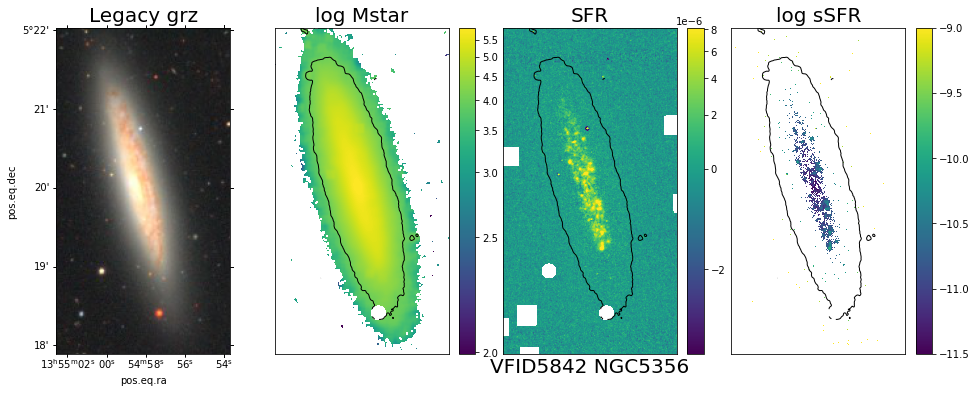

<SkyCoord (ICRS): (ra, dec) in deg
    [(208.76072877, 5.29886408), (208.72510238, 5.3674085 )]>


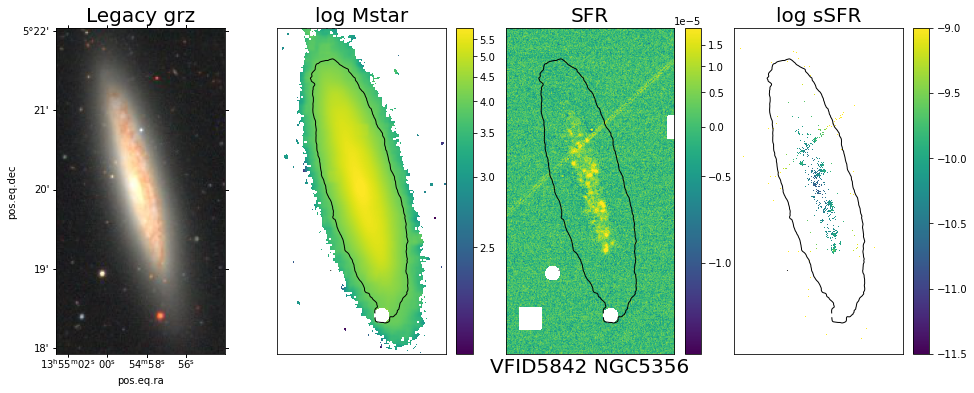

In [198]:
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')

dirname = 'VFID5842-NGC5356-INT-20190206-p120'
xmin,xmax=900,1300
ymin,ymax = 700,1450

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,clevels=[4],contourFlag=True)


dirname = 'VFID5842-NGC5356-HDI-20180313-p056'
xmin,xmax=700,1000
ymin,ymax = 550,1130

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,clevels=[4],contourFlag=True)

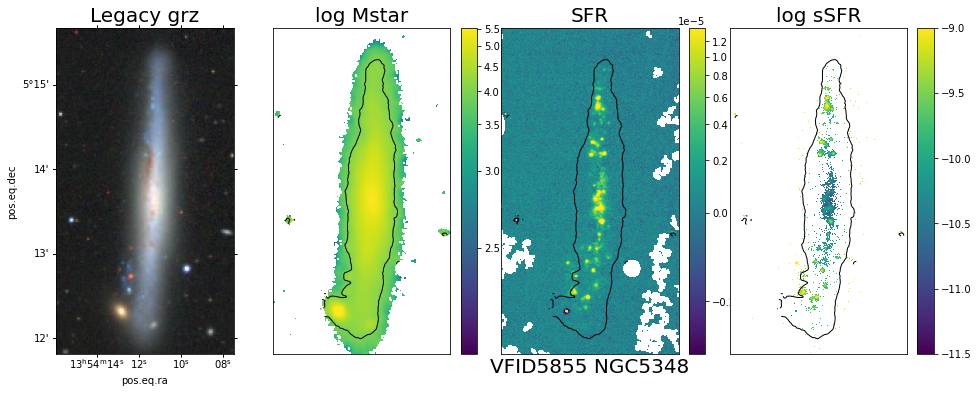

In [136]:
dirname = 'VFID5855-NGC5348-INT-20190206-p120'
xmin,xmax=820,1200
ymin,ymax = 700,1400
plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,clevels=[4.],contourFlag=True)

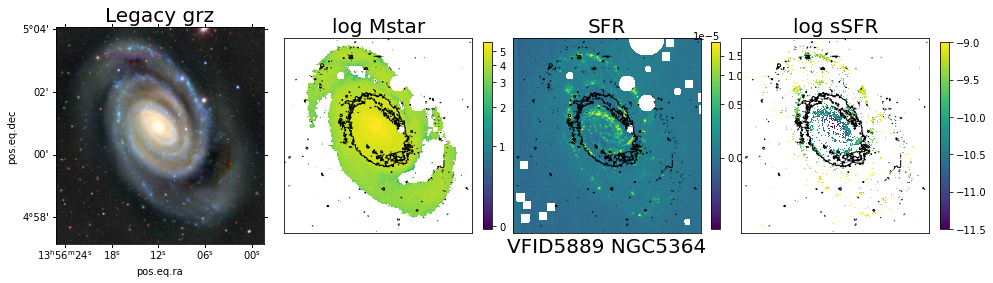

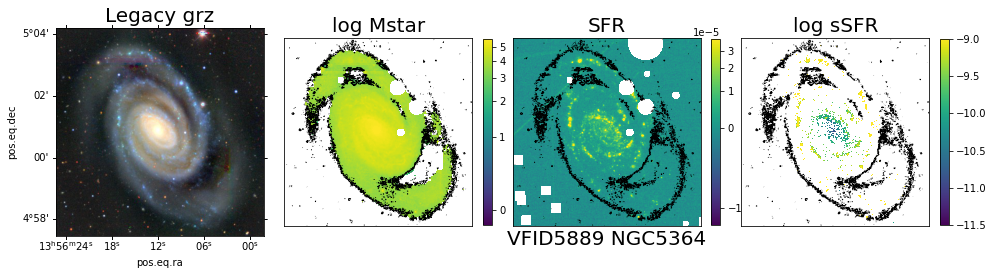

In [137]:
dirname = 'VFID5889-NGC5364-INT-20190206-p120'
xmin,xmax=100,1300
ymin,ymax = 850,2100

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,5.5],cbfrac=.045,clevels=[4.5],contourFlag=True)

dirname = 'VFID5889-NGC5364-HDI-20180313-p056'

xmin,xmax=250,1200
ymin,ymax = 750,1700

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,5.5],cbfrac=.045,clevels=[3.],contourFlag=True)


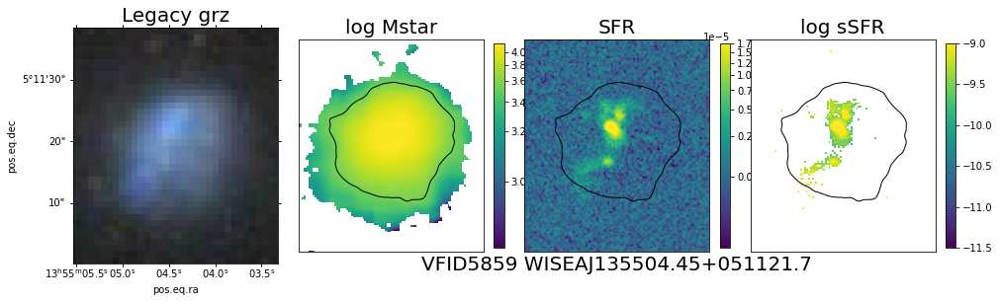

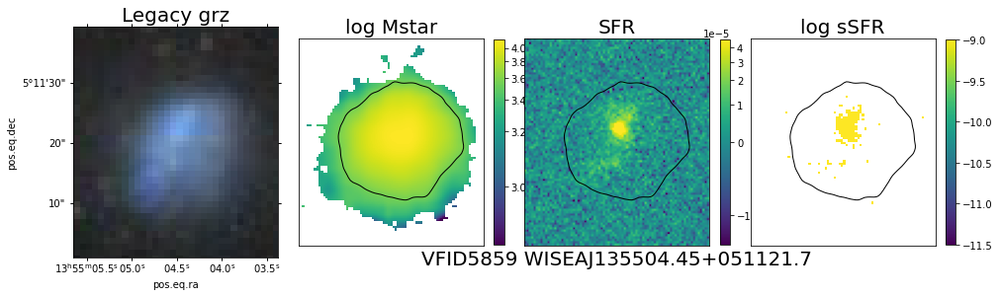

In [138]:
dirname = 'VFID5859-WISEAJ135504.45+051121.7-INT-20190206-p120'
xmin,xmax=50,150
ymin,ymax = 30,145

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,5],cbfrac=.05,contourFlag=True,clevels=[3.55])


dirname = 'VFID5859-WISEAJ135504.45+051121.7-HDI-20180313-p056'
xmin,xmax=35,115
ymin,ymax = 25,115

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,5],cbfrac=.05,contourFlag=True,clevels=[3.55])

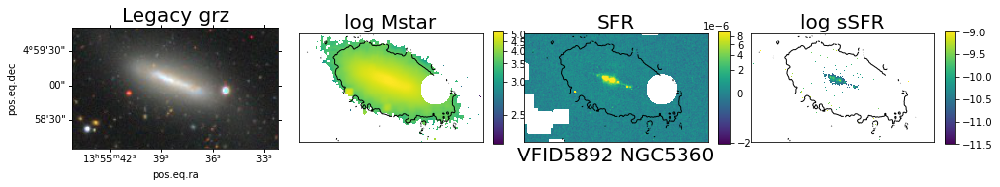

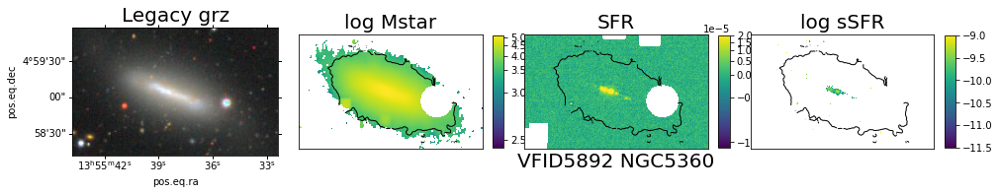

In [139]:
dirname = 'VFID5892-NGC5360-INT-20190206-p120'
xmin,xmax=240,780
ymin,ymax = 300,620

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,4.5],cbfrac=.055,cbaspect=10,contourFlag=True,clevels=[3.6])



dirname = 'VFID5892-NGC5360-HDI-20180313-p056'
xmin,xmax=200,600
ymin,ymax = 250,500

plot_mstar_sfr(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,4.5],cbfrac=.055,cbaspect=10,contourFlag=True,clevels=[3.6])


# area around group


In [7]:
%run ~/github/Virgo/programs/readtablesv2.py

<Figure size 432x288 with 0 Axes>

In [51]:
vfid = dirname.split('-')[0]
print(vfid)

VFID5889


In [55]:
gindex = np.arange(len(v.main))[v.main['VFID'] == vfid][0]
print(gindex)

5889


In [13]:
def plot_positions(dr=5,vfindex=5889):

    ragroup = v.main['RA'][vfindex]
    decgroup = v.main['DEC'][vfindex]
    plt.figure(figsize=(8,6))
    
    spinedir = '/home/rfinn/research/Virgo/tables-north/v2/spines/'
    spine  = Table.read(spinedir+'filament_spine_VirgoIII.fits')
    plt.plot(spine['ra'],spine['dec'],'k--',label='Filament Spine')
    
    
    flag = (np.abs(v.main['RA']-ragroup) < dr) &  (np.abs(v.main['DEC']-decgroup) < dr) 
    plt.scatter(v.main['RA'][flag],v.main['DEC'][flag],c=v.env['Vmodel'][flag],s=1.5*v.main['radius'][flag],vmin=700,vmax=2500)

    hflag = flag & v.main['HAobsflag']
    plt.plot(v.main['RA'][hflag],v.main['DEC'][hflag],'r.',label=r'$\rm Observed \ in \ H\alpha$')
    cb=plt.colorbar(label='Vmodel (km/s)')
    cb.ax.tick_params(labelsize=12)
    cb.set_label(label='Vmodel (km/s)',size=16)
    
    
    xmin = ragroup - dr
    xmax = ragroup + dr

    ymin = decgroup - dr
    ymax = decgroup + dr

    plt.axis([xmax,xmin,ymin,ymax])

    plt.xlabel('RA (deg)',fontsize=16)
    plt.ylabel("Dec (deg)",fontsize=16)
    plt.legend()
    

        
    plt.figure()
    plt.hist(v.main['vr'][flag])
    plt.xlabel('$v_r \ (km/s)$',fontsize=16)
    plt.show()

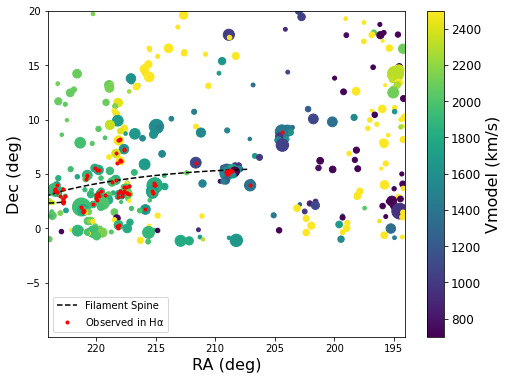

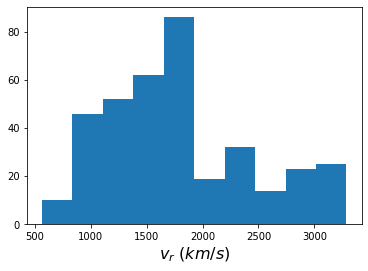

In [495]:
plot_positions(dr=15)

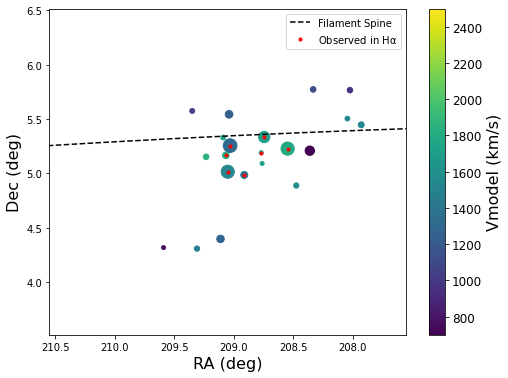

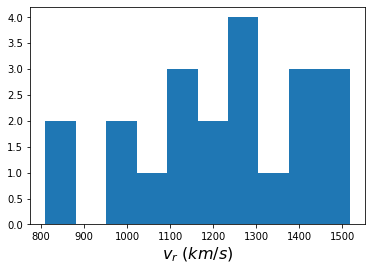

In [448]:
plot_positions(dr=1.5)

In [375]:
v.main['vr'][5889]

1239.7

In [377]:
v.env[5889]

VFID,DM,SGX,SGY,SGZ,nCI08,nCI08_err,distSGX_Virgo,distSGY_Virgo,distSGZ_Virgo,n5th_2D,n5th_2D_err,n5th,n5th_err,Vcosmic,Vmodel,Vmedian,poor_group_memb,rich_group_memb,pure_field,nearest_filament_dist_2D,nearest_filament_dist_3D,filament,filament_PA,orientation_wrt_filament,filament_member,mem_phase_space,cluster_member,mem_Mould00,sep_degree
bytes8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,bool,bool,float64,float64,bytes40,float64,float64,bool,bool,bool,bool,float64
VFID5889,31.173525987210276,-5.289455099409389,11.002692957213254,3.514452541117059,0.2853827379533394,0.084228051929623,-3.0261195644840577,1.1067121561730193,3.9297551317510986,1.8175562473611557,0.8128358644057935,0.26027954621318716,0.1164005516970969,1270.3895631779344,1522.807862532039,1270.3895631779344,False,True,False,0.2537351941488238,0.9599815396860709,VirgoIII,92.16785955029206,47.31785955029206,True,False,False,False,22.327581904882653


In [402]:
spine

SGY,SGX,SGZ,PA,ra,dec
float64,float64,float64,float64,float64,float64
11.928534740558712,-5.514148762035174,3.3965784272262165,92.16785955029206,207.31246930486827,5.419143369027329
11.961473251727368,-5.5724581712104735,3.5425527814681175,92.46215514555526,207.87472918540507,5.397694716332857
11.99444332737831,-5.63107782611789,3.687515135710018,92.75514335145672,208.42572270014955,5.373858816187031
12.027456967511542,-5.689995726757419,3.831453489951919,93.04688760404117,208.9655102203247,5.347758747372199
12.060526172127059,-5.749199873129067,3.97435584419382,93.33745687577277,209.4941594215193,5.319514859830247
12.093662941224867,-5.808678265232829,4.11621019843572,93.6269257626557,210.01174466226374,5.289244688475326
12.12687927480496,-5.868418903068707,4.257004552677621,93.91537459737727,210.5183463853577,5.257062884831534
12.160187172867344,-5.928409786636701,4.396726906919523,94.20288959187404,211.01405054296927,5.223081165204735
12.193598635412012,-5.98863891593681,4.535365261161423,94.48956301252171,211.49894804625185,5.187408274110509


In [2]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(df, x='sepal_length', y='sepal_width', z='petal_width',
              color='species')
fig.show()


# phase space diagram

In [314]:
# read in tempel group file
infile = homedir+'/research/Virgo/NGC5364-group/Tempel2017-table1-groupMembers.fits'
ttab = Table.read(infile)
ttab

VFID,RA,DEC,vr,A100flag,COflag,HAflag,HAobsflag,prefix,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51,col52,col53,col54,Separation
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,arcsec
bytes8,float64,float64,float64,bool,bool,bool,bool,bytes36,int32,int64,int64,int32,int16,int16,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float32,float64,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64
VFID5764,208.33264200000002,5.7716873,1046.5,False,False,False,False,VFID5764-UGC08799,582693,2032271936851044352,1237661970121949501,64186,15,9,22.025384,0.003490624,0.004393272,5.4729e-05,19.406075,21.897038,208.33264085,5.771654411,340.287816713,64.058129838,114.725035312,15.563434787,23.207413345,-26.218250577,-8.628765,18.054696,-8.891156,18.090268,16.076203,15.223241,15.024659,15.206293,-13.623506,-15.644638,-16.498623,-16.694285,-16.515944,-0.011646,-0.004578,-0.003555,-0.006476,-0.003182,0.133072,0.097913,0.071015,0.053848,0.038179,0.0285397,1.002127,0.00441,0.02466,0.70866,0.26227,3.106891,34.85070651,5.81477523,2.7231114,2.37015151,0.11847202617212138
VFID5767,208.02353549999998,5.7650211,984.1,False,False,False,False,VFID5767-WISEAJ135205.63+054553.8,583842,2032284856112670720,1237661970121818287,64186,15,12,22.025384,0.003282482,0.004189444,7.547e-06,18.506594,21.852964,208.023489503,5.765041177,339.685700528,64.218355232,114.650490174,15.264288604,22.900396135,-26.239802751,-8.503651,18.056146,-8.900311,18.324157,16.766323,16.258287,16.073707,16.283701,-13.391652,-14.951315,-15.463324,-15.643675,-15.437735,-0.00961,-0.007781,-0.003809,-0.008038,-0.003984,0.124806,0.091831,0.066603,0.050503,0.035807,0.0109984,1.002127,0.01184,0.10359,0.69053,0.19404,2.963336,33.83715573,5.80512181,2.79161261,2.39922682,0.17990861754492415
VFID5802,209.0390865,5.5427738,1096.1,True,False,False,False,VFID5802-SDSSJ135609.35+053233.2,584155,962810761330059264,1237655126630531430,64186,15,15,22.025384,0.003655356,0.004549062,1.0098e-05,20.093512,21.930722,209.039066892,5.542724769,341.332693276,63.480766342,115.141342863,16.184927432,23.91963142,-26.434644032,-8.891917,17.951124,-8.924548,24.224629,16.847107,17.065646,17.583682,20.618844,-7.494776,-14.869069,-14.656288,-14.131971,-11.101556,-0.006014,-0.009243,-0.003486,-0.009767,-0.00502,0.128611,0.094631,0.068634,0.052043,0.036899,0.00523016,1.002127,0.0,0.0,0.0,0.0,3.131225,35.95894106,5.77131444,2.57145085,2.29542277,0.18998062448462494
VFID5842,208.7435295,5.3337007,1369.8,True,True,True,True,VFID5842-NGC5356,533675,963880035784091648,1237654881271152801,64186,15,3,22.025384,0.004578432,0.005477154,1.5808e-05,24.187751,22.131339,208.743545106,5.333676444,340.525067826,63.468141811,115.273366359,15.847071642,23.634467437,-26.676365723,-8.872459,18.116862,-9.102471,14.451605,13.000098,12.331685,11.88819,11.573385,-17.264831,-18.721211,-19.393383,-19.833582,-20.15247,-0.008983,-0.00411,-0.000352,-0.003648,0.000436,0.12955,0.095322,0.069135,0.052423,0.037169,0.410538,1.002127,0.00193,0.00636,0.33712,0.65459,3.685363,35.69546551,5.75881129,2.63251726,2.32219709,0.10370226784599672
VFID5844,209.0888115,5.3289876,1402.5,False,False,False,False,VFID5844-SDSSJ135621.31+051944.2,583394,963890481144555520,1237654881271349558,64186,15,13,22.025384,0.004680308,0.005574188,8.6851e-05,24.615714,22.152309,209.088823792,5.328947805,341.160274345,63.275376664,115.369727329,16.178178348,23.978155661,-26.66605951,-9.00244,18.087735,-9.083762,18.282385,16.989528,16.325422,15.908519

In [371]:
TgroupMemb = np.zeros(len(v.main),'bool')
for vfid in ttab['VFID']:
    TgroupMemb[v.main['VFID'] == vfid] = True
    
    
# get mass weighted center
badMassFlag = v.magphys['logMstar_med'] < 2

combinedMass = v.magphys['logMstar_med'] * ~badMassFlag + v.magphys['logMstar_best'] * badMassFlag

combinedMass[TgroupMemb]


# calculate the mass-weighted center

RAcenter = np.sum(v.main['RA'][TgroupMemb]*combinedMass[TgroupMemb])/np.sum(combinedMass[TgroupMemb])
print(RAcenter)

DECcenter = np.sum(v.main['DEC'][TgroupMemb]*combinedMass[TgroupMemb])/np.sum(combinedMass[TgroupMemb])
print(DECcenter)


vrcenter = np.sum(v.main['vr'][TgroupMemb]*combinedMass[TgroupMemb])/np.sum(combinedMass[TgroupMemb])
print(vrcenter)

# Tempel value for group
print(0.004089*3e5)

208.82404206810787
5.167348892927561
1224.1003279391348
1226.6999999999998


average vr of group members = 1223.8


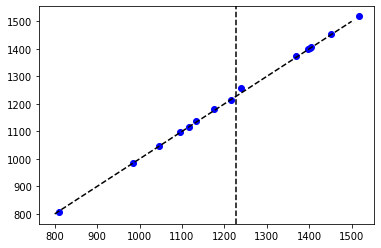

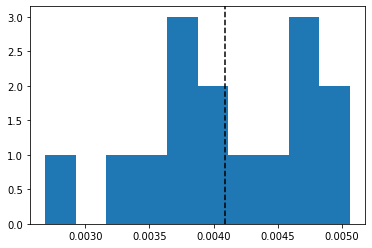

In [331]:
# compare temple and our vr
plt.figure()
plt.plot(ttab['vr'],ttab['col8']*3.e5,'bo')
xline = np.linspace(800,1500,100)
plt.plot(xline,xline,'k--')
plt.axvline(x=0.004089*3.e5,ls='--',color='k')
plt.figure()
plt.hist(ttab['col8'])
plt.axvline(x=0.004089,ls='--',color='k')

print(f"average vr of group members = {np.mean(ttab['vr']):.1f}")

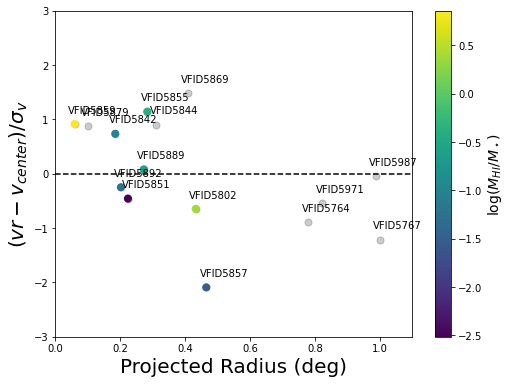

In [394]:
%matplotlib inline
fig = plt.figure(figsize=(8,6)) 
# syntax for 3-D projection 
#ax = plt.axes(projection ='3d') 
    
dr = 1.5
ragroup = v.main['RA'][5889]
decgroup = v.main['DEC'][5889]

# use center of group from Tempel
ragroup = 208.821650229
decgroup =5.170919533 
zgroup = 0.004089 #± .00064
#zcmbgroup = 0.004987

# using average vr
groupsigma = 198
flag = (np.abs(v.main['RA']-ragroup) < dr) &  (np.abs(v.main['DEC']-decgroup) < dr)
flag = np.sqrt((v.main['RA']-ragroup)**2 +  (v.main['DEC']-decgroup) **2) < dr 

dr = np.sqrt((v.main['RA']-ragroup)**2 +  (v.main['DEC']-decgroup) **2)
dv = (v.main['vr'] - zgroup*3e5)/groupsigma

dr = np.sqrt((v.main['RA']-RAcenter)**2 +  (v.main['DEC']-DECcenter) **2)
dv = (v.main['vr'] - vrcenter)/groupsigma

# plot phase space
#plt.plot(dr[flag],dv[flag],'ko',alpha=.2)

HIflag = v.a100['logMH'] > 1
fracHI = v.a100['logMH'] - combinedMass 

plt.scatter(dr[flag  & TgroupMemb],dv[flag & TgroupMemb],c='k',alpha=.2,s=50)
plt.scatter(dr[flag & HIflag & TgroupMemb],dv[flag & HIflag & TgroupMemb],c=fracHI[flag & HIflag & TgroupMemb],s=50)
cb = plt.colorbar(label='$\log(M_{HI}/M_\star)$')

cb.set_label(label='$\log(M_{HI}/M_\star)$',fontsize=14)
plt.axhline(y=0,ls='--',color='k')
plt.xlabel("Projected Radius (deg)",fontsize=20)
plt.ylabel("$(vr - v_{center})/\sigma_v$ ",fontsize=20)
#clipflag = (v.env['filament'] == 'VirgoIII') & (v.env['filament_member'])
#ax.plot3D(v.env['SGX'][clipflag], v.env['SGY'][clipflag], v.env['SGZ'][clipflag],'c.',color='0.5',alpha=.5) 


ids =  np.arange(len(v.main))[TgroupMemb]
for i in ids:

    plt.text(dr[i]-.02,dv[i]+.2,v.main['VFID'][i])
plt.ylim(-3,3)
plt.xlim(0,1.1)
#cb = fig.colorbar(p,fraction=.03,pad=.1)
#cb.ax.tick_params(labelsize=12)
#cb.set_label(label=colorname,size='large')
plt.savefig(plotdir+'/NGC5346-phasespace.png')

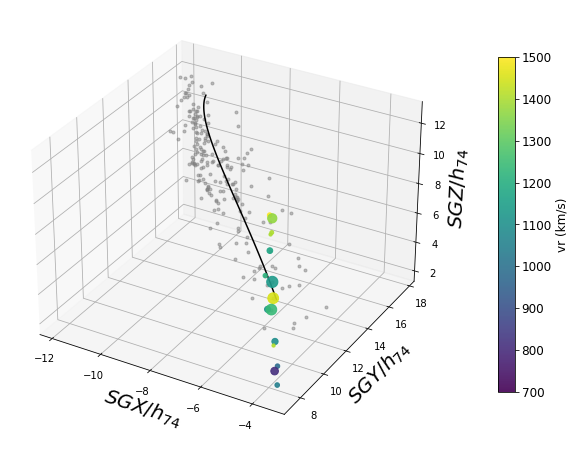

In [376]:
%run ~/github/Virgo/programs/readtablesv2.py
%matplotlib inline
fig = plt.figure(figsize=(10,8)) 
# syntax for 3-D projection 
ax = plt.axes(projection ='3d') 
    
dr = .6
ragroup = v.main['RA'][5889]
decgroup = v.main['DEC'][5889]
flag = (np.abs(v.main['RA']-ragroup) < dr) &  (np.abs(v.main['DEC']-decgroup) < dr) 
flag = np.sqrt((v.main['RA']-ragroup)**2 +  (v.main['DEC']-decgroup) **2) < dr 



clipflag = (v.env['filament'] == 'VirgoIII') & (v.env['filament_member'])
ax.plot3D(v.env['SGX'][clipflag], v.env['SGY'][clipflag], v.env['SGZ'][clipflag],'c.',color='0.5',alpha=.5) 
#ax.set_title(filament_string.replace('_',' ').replace('-',' '),fontsize=20)
ax.set_xlabel('$SGX/h_{74}$',fontsize=20)
ax.set_ylabel('$SGY/h_{74}$',fontsize=20)
ax.set_zlabel('$SGZ/h_{74}$',fontsize=20)


spinedir = '/home/rfinn/research/Virgo/tables-north/v2/spines/'
spine  = Table.read(spinedir+'filament_spine_VirgoIII.fits')
ax.plot3D(spine['SGX'], spine['SGY'], spine['SGZ'],color='k')

colorname='vr (km/s)'


flag = TgroupMemb
p = ax.scatter(v.env['SGX'][flag],v.env['SGY'][flag],v.env['SGZ'][flag],c=v.main['vr'][flag],s=1.*v.main['radius'][flag],vmin=700,vmax=1500,alpha=.9)

    

cb = fig.colorbar(p,fraction=.03,pad=.1)
cb.ax.tick_params(labelsize=12)
cb.set_label(label=colorname,size='large')
plt.savefig(plotdir+'/filament_3d.png')

In [14]:
# checking other nearby group

nedname = 'NGC 5248'
vfindex = v.main['NEDname'] == nedname

In [17]:
vfindex = np.arange(len(v.main))[vfindex][0]

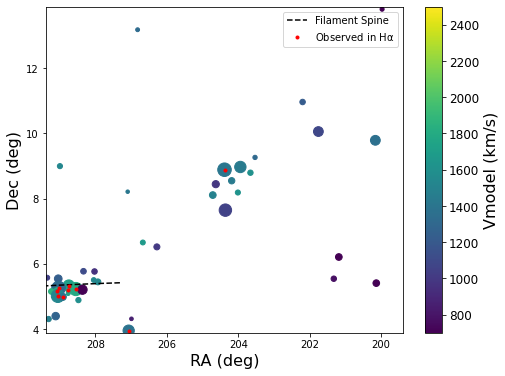

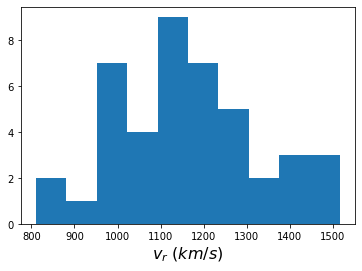

In [19]:
plot_positions(dr=5,vfindex=vfindex)

In [18]:
np.random.random(size=10)


array([0.42124005, 0.97800329, 0.67116429, 0.2377172 , 0.53905971,
       0.99517949, 0.70576686, 0.80753371, 0.46829991, 0.32824853])

# SFR - Mstar Figure



In [13]:
%run ~/github/Virgo/programs/readtablesv2.py

<Figure size 432x288 with 0 Axes>

5889 VFID5889
5892 VFID5892
5842 VFID5842
5851 VFID5851
5833 VFID5833
5844 VFID5844
5859 VFID5859
5868 VFID5868
5879 VFID5879


Text(0, 0.5, '$\\log(SFR/(M_\\odot/yr))$')

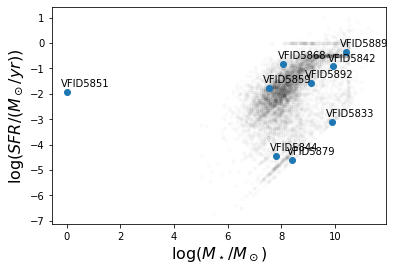

In [26]:
plt.figure()
x = v.magphys['logMstar_med']
y = v.magphys['logSFR_med']

magflag = x > 4

flag = magflag
plt.plot(x[flag],y[flag],'k.',alpha=.01)

# plot the group members

for vf in vfid_group_membs:
    print(vf,v.main['VFID'][vf])
    plt.plot(x[int(vf)],y[int(vf)],'bo',c=mycolors[0])
    plt.text(x[int(vf)]-.2,y[int(vf)]+.2,v.main['VFID'][vf])
    
plt.xlabel("$\log(M_\star/M_\odot)$",fontsize=16)
plt.ylabel("$\log(SFR/(M_\odot/yr))$",fontsize=16)

VFID5851 or NGC5363 does not have logMstar_med magphys results.

This is saturated in g and r at the center

reframing plot to remove that one.

5842 VFID5842
5844 VFID5844
5851 VFID5851
5855 VFID5855
5859 VFID5859
5868 VFID5868
5879 VFID5879
5889 VFID5889
5892 VFID5892


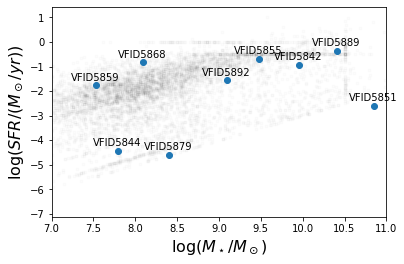

In [144]:
plt.figure(figsize=(6,4))
plt.subplots_adjust(bottom=.15)
x = v.magphys['logMstar_med']
y = v.magphys['logSFR_med']

magflag = x > 4

flag = magflag
plt.plot(x[flag],y[flag],'k.',alpha=.01)

# plot the group members

for vf in vfid_group_membs:
    if vf == 5851:
        print(vf,v.main['VFID'][vf])
        xp = v.magphys['logMstar_best'][int(vf)]
        yp = v.magphys['logSFR_best'][int(vf)]
        plt.plot(xp,yp,'bo',c=mycolors[0])
        plt.text(xp-.3,yp+.2,v.main['VFID'][vf])
        continue
    else:
        print(vf,v.main['VFID'][vf])
        plt.plot(x[int(vf)],y[int(vf)],'bo',c=mycolors[0])
        plt.text(x[int(vf)]-.3,y[int(vf)]+.2,v.main['VFID'][vf])
    
plt.xlabel("$\log(M_\star/M_\odot)$",fontsize=16)
plt.ylabel("$\log(SFR/(M_\odot/yr))$",fontsize=16)

plt.xlim(7,11)
plt.savefig(plotdir+'/NGC5364-sfr-mstar.png')

# Plot SFR Indicators

legacy, NUV, halpha, WISE W3

In [225]:
def plot_sfr_indicators(dirname,xmin=None,xmax=None,ymin=None,ymax=None,xticks=True,figsize=[16,6],cbfrac=.08,cbaspect=20,clevels=[4,5],contourFlag=False):
    %matplotlib inline
    os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
    # add scale factor for continuue after the directory name


    cwd = os.getcwd()
    os.chdir(dirname)
    massim = dirname+"-logmstar-vr.fits"
    sfrim = dirname+"-sfr-vr.fits"
    ssfrim = dirname+"-ssfr.fits"
    mask = dirname+'-R-mask.fits'
    vfid = dirname.split('-')[0]
    print(dirname+'/galex/*nuv*.fits')
    print("sfrim = ",sfrim)
    try:
        nuvim = glob.glob('galex/*nuv*.fits')[0]
    except IndexError:
        nuvim = None
        print("problem getting nuv image ",dirname)
    # look for coadded image first
    t = glob.glob('unwise/*w3-coadd.fits')
    if len(t) > 0:
        w3im = t[0]
    else:
        t = glob.glob(dirname+'/unwise/*w3-img-m.fits')
        w3im = t[0]
        
        
    titles = ['NUV',r'$H\alpha$',r'$WISE \ 12\mu m$']
    #vmin = [2,0,-11.5]
    #vmax = [6,1.e-6,-9]
    allim = [nuvim,sfrim,w3im]
    
    print(nuvim,w3im)
    
    if xmin is not None:
        # get ra  and dec corresponding to xmin,ymin xmax,ymax from sfr image
        # plot the legacy image in panel 1
        xcoords = np.array([xmin,xmax])
        ycoords = np.array([ymin,ymax])

        header = fits.getheader(sfrim)
        wcs = WCS(header)
        sky = wcs.pixel_to_world(xcoords,ycoords)
        print("skycoords = ",sky)
        
    plt.figure(figsize=(figsize[0],figsize[1]))

    plt.subplots_adjust(wspace=0.1)
    maskdat = fits.getdata(mask)

    allax = []
    for i, im in enumerate(allim):
        plt.subplot(1,4,i+2)
        dat = fits.getdata(im)
        
        if dat.shape == maskdat.shape:
            mdat = np.ma.array(dat,mask=maskdat)
        else:
            mdat = dat
        if xmin is None:
            mdat = mdat
        #elif i == 0: # galex images don't have WCS?
        #    mdat = mdat
        elif i in [0,2]: # convert coords for galex and unwise
            print(i,im)
            imwcs = WCS(fits.getheader(im))
            # set limits in ra,dec
            x,y = imwcs.world_to_pixel(sky)
            print(x,y)
            print(int(np.rint(y[0])),int(np.rint(y[1])),int(np.rint(x[0])),int(np.rint(x[1])))
            print(mdat.shape)
            mdat = mdat[int(np.rint(y[0])):int(np.rint(y[1])),int(np.rint(x[0])):int(np.rint(x[1]))] 
        else:
            mdat = mdat[ymin:ymax,xmin:xmax]
            
            
        #plt.imshow(mdat,origin='lower',interpolation='nearest')
        #if i == 2:
        #    plt.imshow(mdat,vmin=vmin[i],vmax=vmax[i],origin='lower',interpolation='nearest')
        #else:
        #    display_image(mdat,percent=99.5,cmap='viridis')#,vmin=vmin[i],vmax=vmax[i])
        display_image(mdat,percent=99.5,cmap='viridis')#,vmin=vmin[i],vmax=vmax[i])
        
        if not xticks: 
            plt.xticks([],[])
            plt.yticks([],[])
        plt.title(titles[i],fontsize=20)
        plt.colorbar(fraction=cbfrac,aspect=cbaspect)
        if i == 1:
            t = dirname.split('-')
            plt.xlabel(t[0]+' '+t[1],fontsize=20)
        # plot contours from mass
        allax.append(plt.gca())
    # plot the legacy image in panel 1
    xcoords = np.array([xmin,xmax])
    ycoords = np.array([ymin,ymax])
    
    # get ramin,ramax and decmin,decmax from SFR image
    sfrim = dirname+"-sfr-vr.fits"
    header = fits.getheader(sfrim)
    wcs = WCS(header)
    sky = wcs.pixel_to_world(xcoords,ycoords)
    
    # read in header from legacy r-band image
    legacyr = glob.glob("legacy/*r.fits")[0]
    #print(legacyr)
    legacy_jpg = legacyr.replace('-r.fits','.jpg')
    jpeg_data = Image.open(legacy_jpg)
    legwcs = WCS(fits.getheader(legacyr))
    # plot jpg as projection of legacy r-band
    plt.subplot(1,4,1,projection=legwcs)
    plt.imshow(jpeg_data)
    # set limits in ra,dec
    x,y = legwcs.world_to_pixel(sky)
    # convert ramin,ramax and decmin,decmax to (x,y)
    plt.axis([x[0],x[1],y[0],y[1]])
    #print(x[0],x[1],y[0],y[1])
    if contourFlag:
        # get contours from logmstar image
        hdu = fits.open(massim)
        contour_data = hdu[0].data
        contour_header = hdu[0].header
        hdu.close()
        mcontour_data = np.ma.array(contour_data,mask=maskdat)
        for ax in allax:
            ax.contour((mcontour_data[ymin:ymax,xmin:xmax]),levels=clevels, colors='k',linestyles='-',linewidths=1)#,transform=ax.get_transform(WCS(contour_header))
    #plt.contour(contour_data[y[0]:y[1],x[0]:x[1]],levels = [4,5,6],colors='c',alpha=0.5)
    plt.title("Legacy grz",fontsize=20)
    # read in the
    plt.savefig(os.path.join(plotdir,dirname)+'-sfr-indicators.png')
    plt.show()

    os.chdir(cwd)

In [226]:
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')
sfrim = 'VFID5842-NGC5356-INT-20190206-p120/VFID5842-NGC5356-INT-20190206-p120-sfr-vr.fits'
nuvim = 'VFID5842-NGC5356-INT-20190206-p120/galex/VFID5842-nuv-719.fits'
nuvim = 'VFID5842-NGC5356-INT-20190206-p120/unwise/VFID5842-unwise-w3-coadd.fits'
xmin,xmax=900,1300
ymin,ymax = 700,1450

xcoords = np.array([xmin,xmax])
ycoords = np.array([ymin,ymax])

header = fits.getheader(sfrim)
wcs = WCS(header)
sky = wcs.pixel_to_world(xcoords,ycoords)
print("skycoords = ",sky)

temp = fits.open(nuvim)
header2 = temp[0].header
imwcs = WCS(header2)
print(imwcs)
x,y = imwcs.world_to_pixel(sky)
#print(sky.ra.deg,sky.dec)
#x,y = imwcs.world_to_pixel(sky.ra,sky.dec)

skycoords =  <SkyCoord (ICRS): (ra, dec) in deg
    [(208.76068566, 5.29824368), (208.72371643, 5.36724449)]>
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 208.7437166523  5.33379695813  
CRPIX : 137.5  138.0  
CD1_1 CD1_2  : -0.0007637098897249  0.0  
CD2_1 CD2_2  : 0.0  0.0007637098897249  
NAXIS : 274  275


VFID5842-NGC5356-INT-20190206-p120/galex/*nuv*.fits
sfrim =  VFID5842-NGC5356-INT-20190206-p120-sfr-vr.fits
galex/VFID5842-nuv-719.fits unwise/VFID5842-unwise-w3-coadd.fits
skycoords =  <SkyCoord (ICRS): (ra, dec) in deg
    [(208.76068566, 5.29824368), (208.72371643, 5.36724449)]>
0 galex/VFID5842-nuv-719.fits
[198.39768048 286.6781238 ] [154.40263736 320.04879517]
154 320 198 287
(479, 479)
2 unwise/VFID5842-unwise-w3-coadd.fits
[114.37574674 162.57342532] [ 90.44690886 180.79655635]
90 181 114 163
(275, 274)


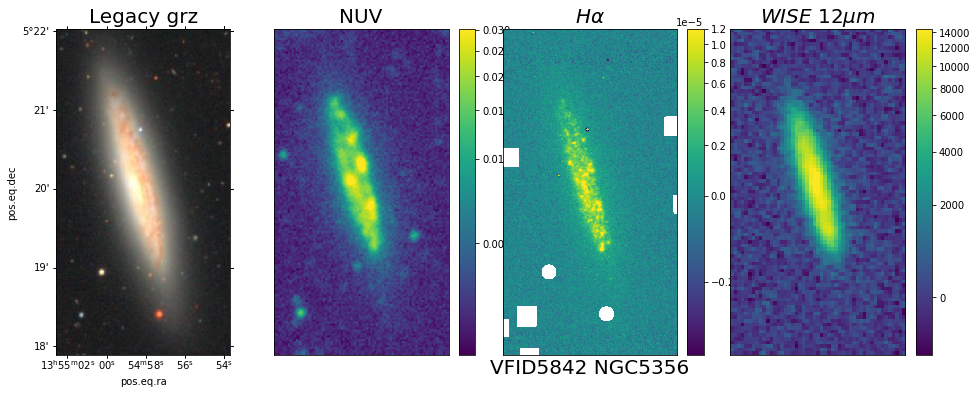

In [233]:
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')

dirname = 'VFID5842-NGC5356-INT-20190206-p120'
xmin,xmax=900,1300
ymin,ymax = 700,1450

plot_sfr_indicators(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,clevels=[4],contourFlag=False)


dirname = 'VFID5842-NGC5356-HDI-20180313-p056'
xmin,xmax=700,1000
ymin,ymax = 550,1130

#plot_sfr_indicators(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,clevels=[4],contourFlag=False)

VFID5892-NGC5360-INT-20190206-p120/galex/*nuv*.fits
sfrim =  VFID5892-NGC5360-INT-20190206-p120-sfr-vr.fits
galex/VFID5892-nuv-320.fits unwise/VFID5892-unwise-w3-coadd.fits
skycoords =  <SkyCoord (ICRS): (ra, dec) in deg
    [(208.93396211, 4.96802173), (208.88409544, 4.99747135)]>
0 galex/VFID5892-nuv-320.fits
[ 52.3816473  171.59992159] [ 65.76112236 136.4567565 ]
66 136 52 172
(214, 214)
2 unwise/VFID5892-unwise-w3-coadd.fits
[31.31973529 96.36393437] [38.98677973 77.545816  ]
39 78 31 96
(122, 122)


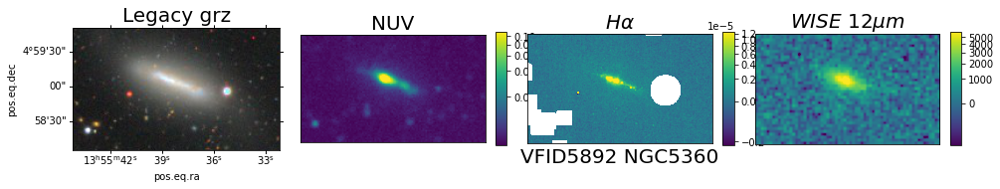

In [236]:
os.chdir(homedir+'/research/Virgo-dev/cont-sub-gr')

dirname = 'VFID5892-NGC5360-INT-20190206-p120'
xmin,xmax=240,780
ymin,ymax = 300,620

plot_sfr_indicators(dirname,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,xticks=False,figsize=[16,4.5],cbfrac=.055,cbaspect=10,contourFlag=False,clevels=[3.6])



# HI Deficiency

In [242]:
v.a100[groupFlag]

VFID,AGC,Name,OrigSrcName,HISrcName,RAdeg_HI,DECdeg_HI,RAdeg_OC,DECdeg_OC,RAdeg_Use,DECdeg_Use,Vhelio,sigV,W50,sigWtot,sigWstat,W20,HIflux,sigflux,SNR,RMS,Dist,sigdist,logMH,siglogMH,HIcode,HIdef,HIdef_flag,HIdef_bos,HIdef_jon,HIdef_bytype,logMstarTaylor,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,modelMagErr_u,modelMagErr_g,modelMagErr_r,modelMagErr_i,modelMagErr_z,cModelMag_u,cModelMag_g,cModelMag_r,cModelMag_i,cModelMag_z,cModelMagErr_u,cModelMagErr_g,cModelMagErr_r,cModelMagErr_i,cModelMagErr_z,petroMag_u,petroMag_g,petroMag_r,petroMag_i,petroMag_z,petroMagErr_u,petroMagErr_g,petroMagErr_r,petroMagErr_i,petroMagErr_z,petroRad_u,petroRad_g,petroRad_r,petroRad_i,petroRad_z,petroR50_g,petroR50_r,petroR50_i,petroR90_g,petroR90_r,petroR90_i,extinction_u,extinction_g,extinction_r,extinction_i,extinction_z,expAB_g,expAB_r,expAB_i,expMag_g,expMag_r,expMag_i,type_2,expRad_g,expRad_r,expRad_i,photoID,spectID,sdss_z,absMag_g,absMag_i,gmag_corr,imag_corr,gmi_corr,absMag_g_corr,absMag_i_corr,gmi_no_int,photFlag_gi
bytes8,int64,bytes8,bytes26,bytes17,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float32,bool,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,bytes18,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
VFID5842,8831,N5356...,HI135458.1+052008_1356+05a,HI135457.9+052001,208.74126,5.33361,208.74332,5.33333,208.74332,5.33333,1367,4,278,8,7,305,4.87,0.1,27.0,2.42,28.2,5.7,8.96,0.18,1,0.8829874,True,0.3472781478380522,0.4231199,0.41107374,9.998433,15.11481,13.4405,12.66144,12.20634,11.89057,0.008589184,0.002083034,0.001946762,0.001912731,0.00264462,14.50014,13.08727,12.68003,12.21306,11.59085,0.008135949,0.002069442,0.001959017,0.001921937,0.002636559,14.57706,13.09942,12.39881,11.94,11.6118,0.03041258,0.007930231,0.0018342,0.003164663,0.01167592,70.00659,62.22573,57.35811,57.28045,57.84497,27.4763,25.24707,25.42466,67.00143,60.07529,60.52983,0.1065301,0.08300757,0.05742425,0.04267237,0.0317404,0.235689,0.3431612,0.3467526,13.08409,12.66134,12.1988,3,43.35294,29.1375,29.39963,1237654881271152801,3880035784091648,0.0045784,-19.2469831115968,-20.0808579115968,12.638957717605791,11.955728012937438,1.0431797046683524,-19.61228782399101,-20.295517528659364,1.1938247999999998,1
VFID5844,0,--,--,--,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,False,--,0.0,--,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0,--,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
VFID5851,8847,N5363...,HI135602.6+051549_1356+05a,HI135602.4+051542,209.00999,5.26167,209.03041,5.25472,209.03041,5.25472,1132,13,577,27,26,616,1.87,0.16,5.3,2.76,22.2,4.4,8.34,0.18,2,1.7907057,True,1.2527225654377325,1.437712,1.071454,7.5888495,19.22913,17.20446,16.3197,16.62592,15.83452,0.04127765,0.00729908,0.005499504,0.008484832,0.01124884,19.28505,17.28261,16.3197,16.6171,15.88823,0.1300138,0.007255042,0.005499504,0.008484356,0.01122541,19.41376,17.42025,16.44002,16.75984,16.04058,0.1520209,0.1355554,0.4695036,0.4637804,0.4057948,1.678206,1.700946,1.700887,1.671456,1.723693,0.9432613,0.9415972,0.9125471,1.584164,1.586956,1.574948,0.114438,0.08916935,0.06168694,0.04584001,0.03409654,0.9997295,0.9998874,0.9997494,17.28261,16.3197,16.6171,3,0.3136611,0.4995812,0.5109131,1237654881271283794,N/A,0.0,-14.538324222253197,

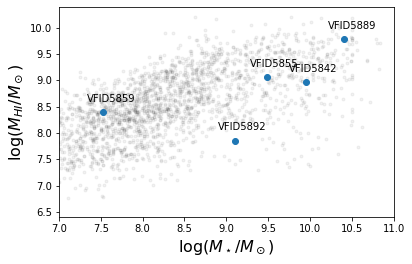

In [396]:
plt.figure()
plt.subplots_adjust(bottom=.15)
flag = (v.magphys['logMstar_med'] > 1 )   & (v.a100['logMH'] > 1)

plt.plot(v.magphys['logMstar_med'][flag],v.a100['logMH'][flag],'k.',alpha=.05)

plt.plot(v.magphys['logMstar_med'][flag & groupFlag],v.a100['logMH'][flag & groupFlag],'bo',alpha=1,color=mycolors[0])

ellipFlag = v.main['VFID'] == 'VFID5851'
plt.plot(v.magphys['logMstar_best'][flag & groupFlag & ellipFlag],v.a100['logMH'][flag & groupFlag & ellipFlag],'bo',alpha=1,color=mycolors[0])
groupIDs = np.arange(len(v.main))[groupFlag & flag]
for i in groupIDs:
    if i == 5851:
        plt.text(v.magphys['logMstar_best'][i]-.2,v.a100['logMH'][i]+.2,v.main['VFID'][i],c='k')
    else:
        plt.text(v.magphys['logMstar_med'][i]-.2,v.a100['logMH'][i]+.2,v.main['VFID'][i],c='k')

plt.xlabel("$\log(M_\star/M_\odot)$",fontsize=16)
plt.ylabel("$\log(M_{HI}/M_\odot)$",fontsize=16)
plt.xlim(7,11)
plt.savefig(plotdir+'/NGC5364-MHI-Mstar.png')

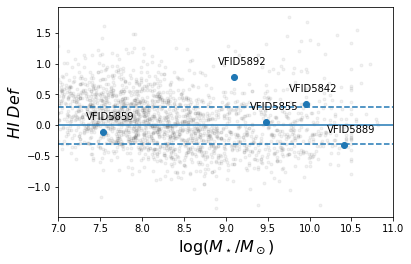

In [283]:
plt.figure(figsize=(6,4))
plt.subplots_adjust(bottom=.15)
ykey = 'HIdef_bos'
flag = (v.magphys['logMstar_med'] > 1 ) & (v.a100['logMH'] > 0)

plt.plot(v.magphys['logMstar_med'][flag],v.a100[ykey][flag],'k.',alpha=.05)

plt.plot(v.magphys['logMstar_med'][flag & groupFlag],v.a100[ykey][flag & groupFlag],'bo',alpha=1,color=mycolors[0])

ellipFlag = v.main['VFID'] == 'VFID5851'
plt.plot(v.magphys['logMstar_best'][flag & groupFlag & ellipFlag],v.a100[ykey][flag & groupFlag & ellipFlag],'bo',alpha=1,color=mycolors[0])
groupIDs = np.arange(len(v.main))[groupFlag & flag]
for i in groupIDs:
    if i == 5851:
        plt.text(v.magphys['logMstar_best'][i]-.2,v.a100[ykey][i]+.2,v.main['VFID'][i],c='k')
    else:
    
        plt.text(v.magphys['logMstar_med'][i]-.2,v.a100[ykey][i]+.2,v.main['VFID'][i],c='k')

plt.xlabel("$\log(M_\star/M_\odot)$",fontsize=16)
plt.ylabel("${HI}\ Def$",fontsize=16)
plt.xlim(7,11)
plt.axhline(y=0,ls='-')
plt.axhline(y=.3,ls='--')
plt.axhline(y=-.3,ls='--')
plt.savefig(plotdir+'/HIdef_logMstar.png')

In [248]:
v.a100[groupFlag]

VFID,AGC,Name,OrigSrcName,HISrcName,RAdeg_HI,DECdeg_HI,RAdeg_OC,DECdeg_OC,RAdeg_Use,DECdeg_Use,Vhelio,sigV,W50,sigWtot,sigWstat,W20,HIflux,sigflux,SNR,RMS,Dist,sigdist,logMH,siglogMH,HIcode,HIdef,HIdef_flag,HIdef_bos,HIdef_jon,HIdef_bytype,logMstarTaylor,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,modelMagErr_u,modelMagErr_g,modelMagErr_r,modelMagErr_i,modelMagErr_z,cModelMag_u,cModelMag_g,cModelMag_r,cModelMag_i,cModelMag_z,cModelMagErr_u,cModelMagErr_g,cModelMagErr_r,cModelMagErr_i,cModelMagErr_z,petroMag_u,petroMag_g,petroMag_r,petroMag_i,petroMag_z,petroMagErr_u,petroMagErr_g,petroMagErr_r,petroMagErr_i,petroMagErr_z,petroRad_u,petroRad_g,petroRad_r,petroRad_i,petroRad_z,petroR50_g,petroR50_r,petroR50_i,petroR90_g,petroR90_r,petroR90_i,extinction_u,extinction_g,extinction_r,extinction_i,extinction_z,expAB_g,expAB_r,expAB_i,expMag_g,expMag_r,expMag_i,type_2,expRad_g,expRad_r,expRad_i,photoID,spectID,sdss_z,absMag_g,absMag_i,gmag_corr,imag_corr,gmi_corr,absMag_g_corr,absMag_i_corr,gmi_no_int,photFlag_gi
bytes8,int64,bytes8,bytes26,bytes17,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float32,bool,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64,bytes18,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
VFID5842,8831,N5356...,HI135458.1+052008_1356+05a,HI135457.9+052001,208.74126,5.33361,208.74332,5.33333,208.74332,5.33333,1367,4,278,8,7,305,4.87,0.1,27.0,2.42,28.2,5.7,8.96,0.18,1,0.8829874,True,0.3472781478380522,0.4231199,0.41107374,9.998433,15.11481,13.4405,12.66144,12.20634,11.89057,0.008589184,0.002083034,0.001946762,0.001912731,0.00264462,14.50014,13.08727,12.68003,12.21306,11.59085,0.008135949,0.002069442,0.001959017,0.001921937,0.002636559,14.57706,13.09942,12.39881,11.94,11.6118,0.03041258,0.007930231,0.0018342,0.003164663,0.01167592,70.00659,62.22573,57.35811,57.28045,57.84497,27.4763,25.24707,25.42466,67.00143,60.07529,60.52983,0.1065301,0.08300757,0.05742425,0.04267237,0.0317404,0.235689,0.3431612,0.3467526,13.08409,12.66134,12.1988,3,43.35294,29.1375,29.39963,1237654881271152801,3880035784091648,0.0045784,-19.2469831115968,-20.0808579115968,12.638957717605791,11.955728012937438,1.0431797046683524,-19.61228782399101,-20.295517528659364,1.1938247999999998,1
VFID5844,0,--,--,--,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,False,--,0.0,--,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0,--,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
VFID5851,8847,N5363...,HI135602.6+051549_1356+05a,HI135602.4+051542,209.00999,5.26167,209.03041,5.25472,209.03041,5.25472,1132,13,577,27,26,616,1.87,0.16,5.3,2.76,22.2,4.4,8.34,0.18,2,1.7907057,True,1.2527225654377325,1.437712,1.071454,7.5888495,19.22913,17.20446,16.3197,16.62592,15.83452,0.04127765,0.00729908,0.005499504,0.008484832,0.01124884,19.28505,17.28261,16.3197,16.6171,15.88823,0.1300138,0.007255042,0.005499504,0.008484356,0.01122541,19.41376,17.42025,16.44002,16.75984,16.04058,0.1520209,0.1355554,0.4695036,0.4637804,0.4057948,1.678206,1.700946,1.700887,1.671456,1.723693,0.9432613,0.9415972,0.9125471,1.584164,1.586956,1.574948,0.114438,0.08916935,0.06168694,0.04584001,0.03409654,0.9997295,0.9998874,0.9997494,17.28261,16.3197,16.6171,3,0.3136611,0.4995812,0.5109131,1237654881271283794,N/A,0.0,-14.538324222253197,

In [292]:
groupIDs = np.arange(len(v.main))[groupFlag]

In [293]:
groupIDs

array([5842, 5844, 5851, 5855, 5859, 5868, 5879, 5889, 5892])

# Lin et al Group Catalog

| | NGC | |
|5842 | NGC5356| |
|5844 | NGC5356| |
|5851 | NGC5356| |
|5855 | PGC| |
|5868 | VVD| |
|5879 | PGC1277985| |
|5889 | NGC5364| |
|5892 | NGC5360| |

In [296]:
v.main[['VFID','objname']][groupIDs]

VFID,objname
bytes8,bytes28
VFID5842,NGC5356
VFID5844,SDSSJ135621.34+051944.3
VFID5851,NGC5363
VFID5855,NGC5348
VFID5859,PGC1279452
VFID5868,VVDS140422444
VFID5879,PGC1277985
VFID5889,NGC5364
VFID5892,NGC5360


| VFID | Objname | Lim Group ID (L)| L+ |  
|VFID5842|	NGC5356| 5515 | 4211
|VFID5844|	SDSSJ135621.34+051944.3|
|VFID5851|	NGC5363|
|VFID5855|	NGC5348|
|VFID5859|	PGC1279452|
|VFID5868|	VVDS140422444|
|VFID5879|	PGC1277985|
|VFID5889|	NGC5364|
|VFID5892|	NGC5360|

# L+ Cagalog
Lim+2017, L+ catalog

## Group ID
group = 4211, 6 members

## Group Properties
* Column (1) group ID: an unique ID of a group within a given group catalog. Note that this cannot be used to cross-identify groups between 2MRS(L), 2MRS(M), 2MRS+(L), and 2MRS+(M), for example. 
* Column (2) cen ID: galaxy ID of the central galaxy of a group in the corresponding galaxy sample; 
* Column (3) ra (in degrees): right ascension (J2000) of the luminosity-weighted group center
* Column (4) dec (in degrees): declination (J2000) of the group center
* Column (5) z: redshift of group center in the CMB rest-frame
* Column (6) log(Mh [Msun/h]): halo mass
* Column (7) N_mem: number of member galaxies
* Column (8) f_edge: the volume fraction that is not cut out from the halo of a group (assumed to be spherical) by the survey boundary or mask
* Column (9) i-o: 
  * 1, if a group is inside the region of completeness for a given halo mass, and thus assigned halo mass by abundance matching
  * 0, if a group is outside the region of completeness, and assigned halo mass using the relation between halo mass and mass proxy from the last iteration of the group finder
* Column (10) known as: conventional name of a system, identified only for well-known massive clusters

```
4211 71189 208.93178 5.12570 0.00525 11.780  7 1.00  1
```

* Indicates that NGC5364 is the central galaxy

# L catalog

## Group ID
group = 5515, 6 members


## Group Properties
* Column (1) group ID: an unique ID of a group within a given group catalog. Note that this cannot be used to cross-identify groups between 2MRS(L), 2MRS(M), 2MRS+(L), and 2MRS+(M), for example. 
* Column (2) cen ID: galaxy ID of the central galaxy of a group in the corresponding galaxy sample; 
* Column (3) ra (in degrees): right ascension (J2000) of the luminosity-weighted group center
* Column (4) dec (in degrees): declination (J2000) of the group center
* Column (5) z: redshift of group center in the CMB rest-frame
* Column (6) log(Mh [Msun/h]): halo mass
* Column (7) N_mem: number of member galaxies
* Column (8) f_edge: the volume fraction that is not cut out from the halo of a group (assumed to be spherical) by the survey boundary or mask
* Column (9) i-o: 
  * 1, if a group is inside the region of completeness for a given halo mass, and thus assigned halo mass by abundance matching
  * 0, if a group is outside the region of completeness, and assigned halo mass using the relation between halo mass and mass proxy from the last iteration of the group finder
* Column (10) known as: conventional name of a system, identified only for well-known massive clusters

```
5515 69677 208.93214 5.12590 0.00525 11.791  6 1.00  1
```

* indicates that NGC5364 is the central galaxy
saved catalog in ~/research/Lim_groups/


# Lim SDSS+M

## Group ID
group = 3432, 7 members

```
3432 71189 208.95732 5.11455 0.00526 11.941  8 1.00  1
```

* VFID5842
* VFID5844
* VFID5859
* VFID5869 - not on Halpha FOV, pretty dwarfy in legacy viewer
* VFID5889
* VFID5892

* VFID5892	208.9113915	4.984993	1174.7	NGC5360	NGC 5360	61077	1237654880734347358	3432	208.91145	4.98505	340.41467	63.08465	0.00484	0.0	1.0	0.0	0.0	8.502	9.019	0.831	0.2934697675164317
* VFID5842	208.7435295	5.3337007	1369.8	NGC5356	NGC 5356	62202	1237654881271152801	3432	208.74355	5.33368	340.52486	63.46812	0.00548	0.0	1.0	0.0	0.0	9.258	9.964	1.003	0.10465471153388382
* VFID5879	208.7612325	5.0903204	1396.6	PGC1277985	SDSS J135502.70+050525.1	71187	1237655126093594752	3432	208.76127	5.09033	340.26289	63.25427	0.00556	0.0	1.0	0.0	0.0	8.006	8.548	0.854	0.13883774887927824
* VFID5889	209.0498895	5.0146562	1239.7	NGC5364	NGC 5364	71189	1237655126093725710	3432	209.04993	5.01486	340.70577	63.03439	0.00513	0.0	1.0	0.0	0.0	9.492	10.293	1.089	0.7479181469475985
* VFID5844	209.0888115	5.3289876	1402.5	SDSSJ135621.34+051944.3	SDSS J135621.31+051944.2	102821	1237654881271349558	3432	209.08882	5.32895	341.16007	63.27535	0.00558	0.0	1.0	0.0	0.0	7.799	8.358	0.869	0.13874657816974129
* VFID5859	208.7687925	5.1894977	1405.3	PGC1279452	WISEA J135504.45+051121.7	114393	1237655126093594767	3432	208.76878	5.18951	340.39664	63.33351	0.00559	0.0	1.0	0.0	0.0	7.787	7.883	0.447	0.06300120164641447
* VFID5869	209.231583	5.1518936	1517.4	PGC049602	CGCG 046-013	114394	1237655126093791380	3432	209.23158	5.15188	341.20535	63.04921	0.00596	0.0	1.0	0.0	0.0	8.456	8.996	0.852	0.05012764795253463


additional galaxy that is not in VF catalogs

(208.82576, 5.06613) - legacy viewer shows a little red dwarf - we probably removed it from the sample

# Lim 2MRS

## MRS+L
VFID5889-NGC5364: group id = 1125 ( 4 members)

* VFID5842
* VFID5851
* VFID5889
* VFID5892

```
1125 98 209.01903 5.18582 0.00484 12.272  4 1.00  1

```

VFID5885-NGC5348: group id = 31706 (only 1 member?)

```
31706 23209 208.54692 5.22720 0.00574 10.952  1 1.00  0
```

## MRS+L

VFID5889-NGC5364: group id= 1002, ngal=451
```
1002 98 209.01556 5.18815 0.00484 12.227  4 1.00  1
```
* VFID5842
* VFID5851
* VFID5889
* VFID5892

VFID5885-NGC5348: group id = 32589, col1 id = 23209


```
32589 23209 208.54692 5.22720 0.00574 10.828  1 1.00  0
```

# Kourchi & Tully Catalog

Mem = 129


VFID5855, Mem = 5

In [304]:
%run ~/github/Virgo/programs/readtablesv2.py

In [300]:
v.kt[groupIDs]

VFID,PGC,R.A.,Dec.,Glon,Glat,SGL,SGB,PGC1,Mem,log_Mass_lum_adapted,Kflag
bytes8,int64,float64,float64,float64,float64,float64,float64,int64,int64,float64,bool
VFID5842,1283020,184.9818,5.4112,282.4729,67.0229,108.8156,-6.9281,39659,129,13.954,True
VFID5844,92910,152.3225,5.4038,234.9139,45.7511,96.6302,-37.4941,92910,1,10.561,True
VFID5851,42174,189.4517,5.3684,293.8423,67.9993,110.1115,-2.6693,42174,1,14.656,True
VFID5855,--,--,--,--,--,--,--,--,5,14.656,False
VFID5859,49468,208.7434,5.3336,340.5248,63.4681,115.2734,15.8469,49547,17,12.757,True
VFID5868,49547,209.0302,5.2547,340.9611,63.2456,115.4289,16.1028,49547,17,12.757,True
VFID5879,1279440,186.8623,5.1879,287.2715,67.3274,109.5644,-5.1956,1279440,1,14.656,True
VFID5889,51604,216.795,5.1336,353.2328,58.3194,117.6634,23.546,51604,2,10.845,True
VFID5892,--,--,--,--,--,--,--,--,1,11.427,False


In [306]:
v.tempel[groupIDs]

VFID,RA,DEC,vr,radius,radius_flag,objname,NSAID,NSAIDV0,AGC,NEDname,HLflag,NSAflag,NSAV0flag,A100flag,COflag,HAflag,HAobsflag,Z0MGSflag,Steerflag,unwiseflag,prefix,name,_RAJ2000_1,_DEJ2000_1,recno,Ns,GalID,GroupID_1,Ngal_1,Rank,Dist.g,zobs,zcmb_1,Dist,RAJ2000_1,DEJ2000_1,umag,gmag,rmag,imag,zmag,Lr,u_Lr,M,Mz,pE,pS0,pSa,pSc,Sloan,_RAJ2000_2,_DEJ2000_2,GroupID_2,Ngal_2,RAJ2000_2,DEJ2000_2,zcmb_2,Dist.c,sig.v,sig.sky,Rvir,Rmax,MNFW,MHer,Lrgroup,GroupID,GroupSize,Separation
,,,,arcsec,,,,,,,,,,,,,,,,,,,deg,deg,,,,,,,Mpc,,,Mpc,deg,deg,mag,mag,mag,mag,mag,10+10Lsun,,,,,,,,,deg,deg,,,deg,deg,,Mpc,km / s,Mpc,Mpc,Mpc,10+12Msun,10+12Msun,10+10Lsun,,,arcsec
bytes8,float64,float64,float64,float32,bool,bytes28,int32,int32,int64,bytes30,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bytes38,bytes8,float64,float64,int32,uint8,int32,int32,int16,int16,float64,float32,float32,float64,float64,float64,float32,float32,float32,float32,float32,float32,uint8,uint8,uint8,float32,float32,float32,float32,bytes5,float64,float64,int32,int16,float64,float64,float32,float64,float32,float32,float32,float64,float32,float32,float32,int32,int32,float64
VFID5842,208.7435295,5.3337007,1369.8,84.94176,True,NGC5356,153757,31560,8831,NGC 5356,True,True,True,True,True,False,False,True,True,True,VFID5859-NGC5356,VFID5859,208.743545,5.3336764,1098,2,261,44,16,3,14.931,0.00458,0.00548,16.402,208.74354,5.33368,14.452,13.0,12.332,11.888,11.573,0.189,0,1,0,0.002,0.006,0.337,0.655,Sloan,208.7732269,5.1916806,44,16,208.77323,5.19168,0.00499,14.931,191.2,0.1011,0.1195,0.2678,7.19,11.8,2.21,44,16,0.10363149131856346
VFID5844,209.0888115,5.3289876,1402.5,14.966535,True,SDSSJ135621.34+051944.3,153781,31567,0,SDSS J135621.31+051944.2,True,True,True,False,False,False,False,False,False,True,VFID5861-SDSSJ135621.31+051944.2,VFID5861,209.0888239,5.3289478,1107,0,100334,44,16,13,14.931,0.00468,0.00557,16.692,209.08882,5.32895,18.282,16.99,16.325,15.909,15.996,0.00476,0,0,0,0.057,0.147,0.485,0.311,Sloan,208.7732269,5.1916806,44,16,208.77323,5.19168,0.00499,14.931,191.2,0.1011,0.1195,0.2678,7.19,11.8,2.21,44,16,0.15001566437179417
VFID5851,209.030166,5.2546944,1133.7,125.060814,True,NGC5363,630849,144114,8847,NGC 5363,True,True,True,True,True,False,False,True,True,True,VFID5868-NGC5363,VFID5868,209.02998,5.2550339,1111,6,583322,44,16,1,14.931,0.0038,0.00469,14.06,209.02998,5.25503,13.848,11.899,10.208,9.749,9.823,1.33,0,2,0,0.0,0.0,0.0,0.0,Sloan,208.7732269,5.1916806,44,16,208.77323,5.19168,0.00499,14.931,191.2,0.1011,0.1195,0.2678,7.19,11.8,2.21,44,16,1.3922557633740205
VFID5855,208.5469185,5.227286,1450.3,116.44511,True,NGC5348,630795,144056,8821,NGC 5348,True,True,True,True,True,False,False,True,True,True,VFID5872-NGC5348,VFID5872,208.5469367,5.2274747,1112,0,583725,44,16,5,14.931,0.00484,0.00574,17.194,208.54694,5.22747,14.891,13.653,13.178,12.825,12.863,0.0863,0,1,0,0.0,0.0,0.0,0.0,Sloan,208.7732269,5.1916806,44,16,208.77323,5.19168,0.00499,14.931,191.2,0.1011,0.1195,0.2678,7.19,11.8,2.21,44,16,0.6824462606954128
VFID5859,208.7687925,5.1894977,1405.3,10.66894,True,PGC1279452,153767,31562,232141,N/A,True,True,True,True,False,False,False,False,True,True,VFID5876-NA,VFID5876,208.7687844,5.1895072,1108,0,107516,44,16,14,14.931,0.00469,0.00559,16.736,208.76878,5.18951,17.513,16.599,16.379,16.281,16.297,0.00452,0,1,0,0.0,0.0,0.0,0.0,Sloan,208.7732269,5.1916806,44,16,208.77323,5.19168,0.00499,14.931,191.2,0.1011,0.1195,0.2678,7.19,11.8,2.21,44,16,0.04486634663929848
VFID5868,209.066256,5.1651548,1499.0,30.0,False,VVDS140422444,0,0,0,SDSS J135615.94+050954.0,True,False,False,False,False,False,False,False,False,True,VFID5885-SDSSJ135615.94+050954.0,VFID5885,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--
VFID5879,208.7612325,5.0903204,1396.6,10.546813,True,PGC1277985,153763,31561,0,N/A,True,True,True,False,False,False,False,False,False,True,VFID5896-NA,VFID5896,208.7612675,5.0903328,1104,0,52159,44,16

In [307]:
(13+3/12)*7

92.75

In [308]:
100/7

14.285714285714286

# Tempel 2MRS Groups

Tempel+
J/A+A/618/A81	79706	0	Bayesian group finder applied to the 2MRS data (Tempel+, 2018)		Clusters_of_galaxies, Galaxies

group = 5022

* VFID5842
* VFID5851
* VFID5855
* VFID5889
* VFID5892


# Tempel SDSS

In [309]:
v.main[groupIDs]

VFID,RA,DEC,vr,radius,radius_flag,objname,PGC,NSAIDV1,NSAIDV0,AGC,NEDname,HLflag,NSAV1flag,NSAV0flag,A100flag,VFID_V1,COflag,HAflag,HAobsflag,Z0MGSflag,Steerflag,unwiseflag,prefix
,,,,arcsec,,,,,,,,,,,,,,,,,,,
bytes8,float64,float64,float64,float32,bool,bytes28,int32,int32,int32,int64,bytes30,bool,bool,bool,bool,bytes8,bool,bool,bool,bool,bool,bool,bytes36
VFID5842,208.7435295,5.3337007,1369.8,84.94176,True,NGC5356,49468,153757,31560,8831,NGC 5356,True,True,True,True,VFID5859,True,True,True,True,True,True,VFID5842-NGC5356
VFID5844,209.0888115,5.3289876,1402.5,14.966535,True,SDSSJ135621.34+051944.3,4012227,153781,31567,0,SDSS J135621.31+051944.2,True,True,True,False,VFID5861,False,False,False,False,True,True,VFID5844-SDSSJ135621.31+051944.2
VFID5851,209.030166,5.2546944,1133.7,125.060814,True,NGC5363,49547,630849,144114,8847,NGC 5363,True,True,True,True,VFID5868,True,True,True,True,True,True,VFID5851-NGC5363
VFID5855,208.5469185,5.227286,1450.3,116.44511,True,NGC5348,49411,630795,144056,8821,NGC 5348,True,True,True,True,VFID5872,True,True,True,True,True,True,VFID5855-NGC5348
VFID5859,208.7687925,5.1894977,1405.3,10.66894,True,PGC1279452,1279452,153767,31562,232141,WISEA J135504.45+051121.7,True,True,True,True,VFID5876,False,True,True,False,True,True,VFID5859-WISEAJ135504.45+051121.7
VFID5868,209.066256,5.1651548,1499.0,30.0,False,VVDS140422444,4710651,0,0,0,SDSS J135615.94+050954.0,True,False,False,False,VFID5885,False,False,True,False,True,True,VFID5868-SDSSJ135615.94+050954.0
VFID5879,208.7612325,5.0903204,1396.6,10.546813,True,PGC1277985,1277985,153763,31561,0,SDSS J135502.70+050525.1,True,True,True,False,VFID5896,False,False,False,False,True,True,VFID5879-SDSSJ135502.70+050525.1
VFID5889,209.0498895,5.0146562,1239.7,114.056816,True,NGC5364,49555,593369,144118,8853,NGC 5364,True,True,True,True,VFID5906,True,True,True,True,True,True,VFID5889-NGC5364


In [391]:
v.main['VFID'][1167]

'VFID1167'

In [400]:
groupIDs

array([5842, 5855, 5859, 5889, 5892])

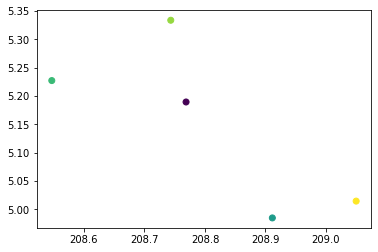

In [398]:
plt.figure()
plt.scatter(v.main['RA'][groupIDs],v.main['DEC'][groupIDs],c=combinedMass[groupIDs])

# Full Legacy Image with Halpha Contours



In [3]:
os.chdir(homedir+'/research/Virgo/NGC5364-group')

imsize = 1.4643800000000002 (deg)
legacy imsize =  5798
retrieving  legacy/NGC5364_group-legacy-5798.jpg
http://legacysurvey.org/viewer/jpeg-cutout?ra=208.744&dec=5.1388&layer=ls-dr10&size=5798&pixscale=1
retrieving  legacy/NGC5364_group-legacy-5798-r.fits
http://legacysurvey.org/viewer/cutout.fits?ra=208.744&dec=5.1388&layer=ls-dr10&size=5798&pixscale=1&bands=r


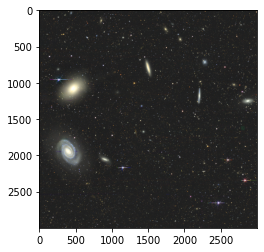

In [5]:
%run ~/github/havirgo/python/ngc5364paper.py

fits_name, jpg_name = get_legacy_images()

imsize = 1.4643800000000002 (deg)
legacy imsize =  6326
retrieving  legacy/NGC5364_group-legacy-6326.jpg
http://legacysurvey.org/viewer/jpeg-cutout?ra=208.744&dec=5.1388&layer=ls-dr10&size=6326&pixscale=1
retrieving  legacy/NGC5364_group-legacy-6326-r.fits
http://legacysurvey.org/viewer/cutout.fits?ra=208.744&dec=5.1388&layer=ls-dr10&size=6326&pixscale=1&bands=r


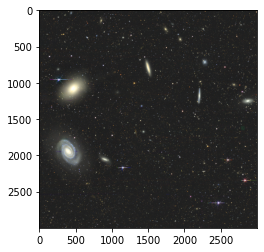

In [6]:
# increasing the size a bit
%run ~/github/havirgo/python/ngc5364paper.py

fits_name, jpg_name = get_legacy_images()